In [96]:
import matplotlib.pyplot as plt
import numpy as np
import os, scipy
import matplotlib.colors as mcolors
import networkx as nx
import pickle

from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

if os.getcwd().split(os.sep)[-1] == "examples":
    os.chdir('..')
    os.chdir('..')
    os.chdir('..')
    os.chdir('..')

# We import the model, stimuli, and the optimal control package
from neurolib.models.wc import WCModel
from neurolib.utils.stimulus import ZeroInput
from neurolib.control.optimal_control import oc_wc, cost_functions
from neurolib.control.optimal_control.oc_utils.plot_oc import plot_oc_nw

# This will reload all imports as soon as the code changes
%load_ext autoreload
%autoreload 2

options = {
    'node_color': 'lightgray',
    'node_size': 1000,
    'width': 2,
    'arrowstyle': '-|>',
    'arrowsize': 20,
    'font_size' : 20,
    'font_weight' : 'bold',
    }

dir = "images_5n_sim"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [228]:
def draw_nwgraph(cmat, filename):
    G = nx.DiGraph() 
    for n in range(cmat.shape[0]):
            for l in range(cmat.shape[1]):
                if cmat[n,l] != 0:
                    G.add_edge(l,n)
    nx.draw(G, with_labels=True, arrows=True, **options)
    plt.savefig(os.path.join(dir,filename), bbox_inches='tight')
    plt.show()

def getperiods(x, dt, N, prominence=0.01, interval=(None, None)):

    timing_list = [None for n in range(N)]
    periods_list = [None for n in range(N)]

    if interval[0] is None:
        interval[0] = 0
    if interval[1] is None:
        interval[1] = -1

    for n in range(N):
        timing_list[n] = scipy.signal.find_peaks(x[n, 0, interval[0]:interval[1]], prominence=prominence)[0]
        periods_list[n] = []
        if len(timing_list[n]) < 3:
            continue
        for pind in range(1, len(timing_list[n])):
            periods_list[n].append(dt * (timing_list[n][pind]-timing_list[n][pind-1]))

    return timing_list, periods_list

def getperiod(x, dt):
    periods = []
    for n in range(x.shape[0]):
        peaks = scipy.signal.find_peaks(x[n,:])[0]
        for p in range(2, len(peaks)-1):
            periods.append(peaks[p] - peaks[p-1])
        
        return np.mean(periods) * dt
    

def get_sim(state, N, period_dt):
    distsum = 0.
    for n in range(N):
        peaks = scipy.signal.find_peaks(-state[n,0,:], prominence=0.01)[0]
        i0_0, i0_1 = peaks[0], peaks[1]
        cycle0 = state[n,0,i0_0:i0_1]

        if n == 0:
            ii0 = 3
            while peaks[ii0] < 1000:
                ii0 += 1
            iii0 = peaks[ii0]
        else:
            ii0 = 3
            while np.abs(iii0 - peaks[ii0]) > period_dt:
                ii0 += 1
        i1_0, i1_1 = peaks[ii0], peaks[ii0+1]
        cycle1 = state[n,0,i1_0:i1_1]

        dtw_distance, warp_path = fastdtw(cycle0, cycle1, dist=euclidean)
        distsum += dtw_distance
    
    return distsum

In [118]:
N = 5
cmats, dmats = [], []

7
11
19


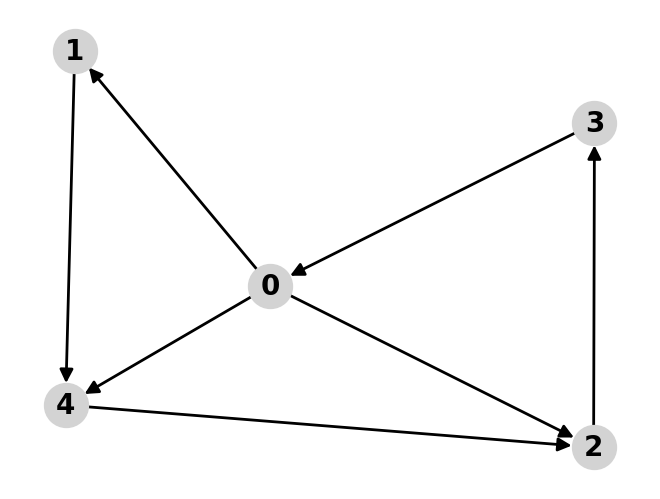

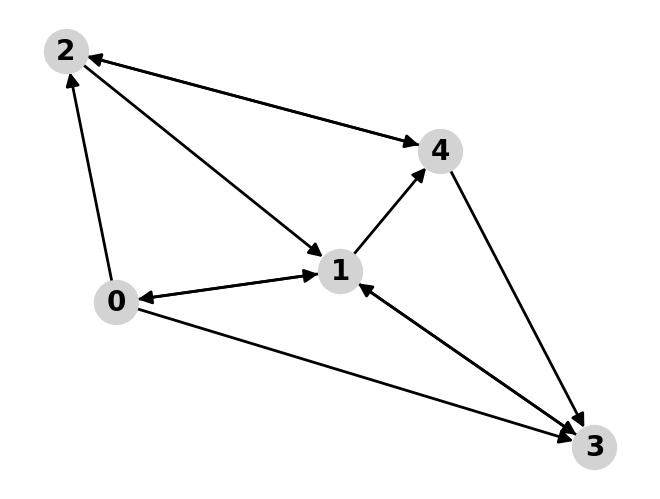

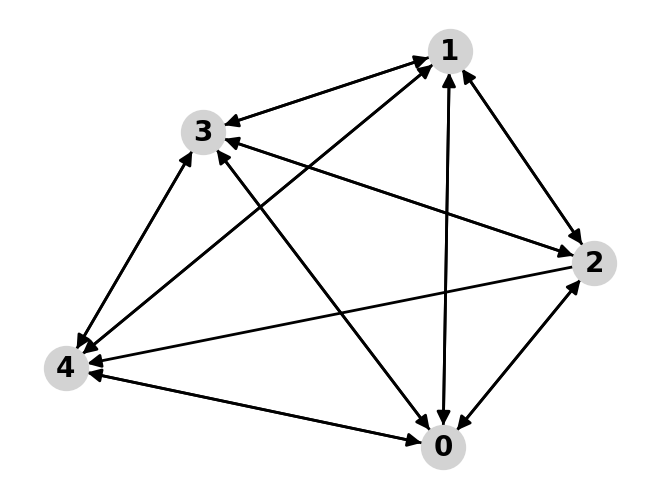

In [119]:
while len(cmats) < 3:
    p_connect = 0.1 * (len(cmats) + 1)**2
    p_inv = 1. - p_connect
    cmat = np.random.choice([0, 1], size=(N,N), p=[p_inv, p_connect])
    use = True
    for n in range(N):
        cmat[n, n] = 0
        if np.amax(cmat[n,:]) == 0:
            use = False
            break
        if np.amax(cmat[:,n]) == 0:
            use = False
            break

    for j in range(len(cmats)):
        if (cmat == cmats[j]).all():
            use = False

    if not use:
        continue

    print(np.sum(cmat))
    cmats.append(cmat)

    dmat = np.random.random((N, N))
    for n1 in range(N):
        for n2 in range(N):
            dmat[n1, n2] *= 30. * cmat[n1,n2]

    dmats.append(np.around(dmat, 0))

for i in range(len(cmats)):
 
    draw_nwgraph(cmats[i], "network_" + str(i) + ".png")
    #print(dmats[-1])

In [150]:
colors = []
n = 0
for col in mcolors.TABLEAU_COLORS:
    colors.append(col)
    n += 1
    if n >= N: break

points = [ [1., 0.1], [1.3, 0.3], [1.6, 0.5] ]

periods_array = np.zeros((len(cmats), len(points)))


In [151]:
print(len(cmats))

3


----------------
0 0


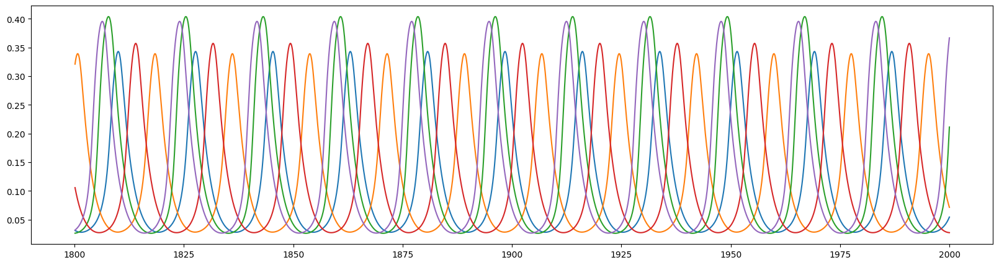

period =  17.689473684210526
period diff =  -0.0005263157894752624
amplitudes =  [0.3430145443183652, 0.33918353256676775, 0.4037806479713163, 0.3571311785000763, 0.39543063387057503] 0.4037806479713163 0.33918353256676775
mean dt =  4.475845410628019
----------------
0 1


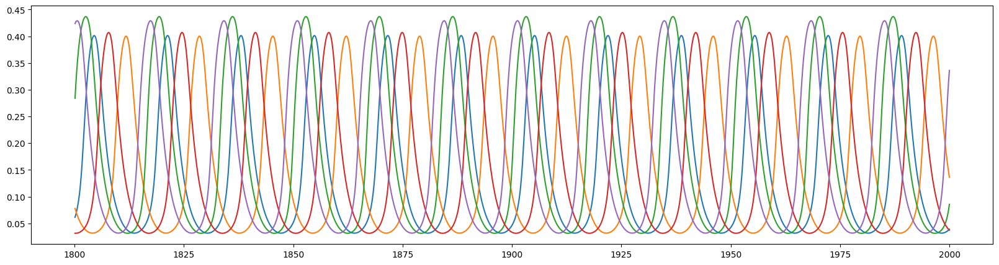

period =  16.78095238095238
period diff =  0.0
amplitudes =  [0.4012787488906791, 0.4001618779116059, 0.436731757682948, 0.4069936346343676, 0.4289218487836022] 0.436731757682948 0.4001618779116059
mean dt =  4.313452914798207
----------------
0 2


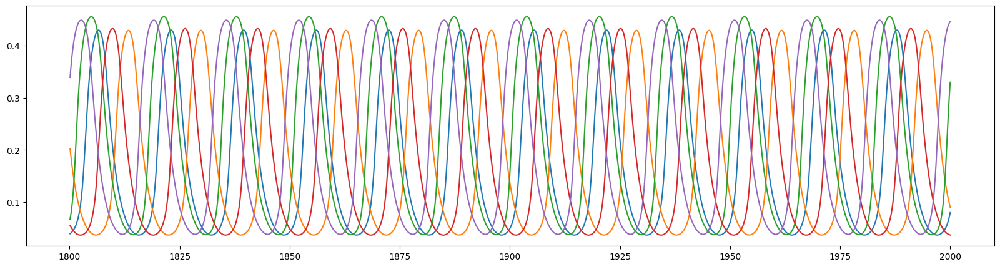

period =  16.485714285714288
period diff =  0.0
amplitudes =  [0.4295921454301653, 0.42907301924037505, 0.4552973845794411, 0.4325588938664964, 0.44861127887395263] 0.4552973845794411 0.42907301924037505
mean dt =  4.488053097345133
----------------
1 0


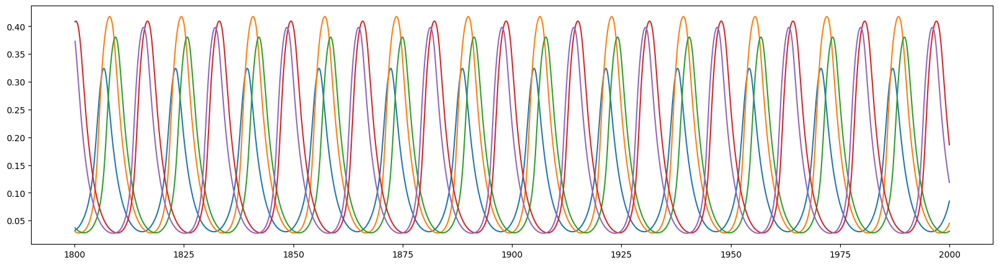

period =  16.400000000000002
period diff =  0.004545454545453964
amplitudes =  [0.32412855742459973, 0.4175090038152624, 0.380554224518915, 0.4093541526168884, 0.39807269783672083] 0.4175090038152624 0.32412855742459973
mean dt =  5.336563876651983
----------------
1 1


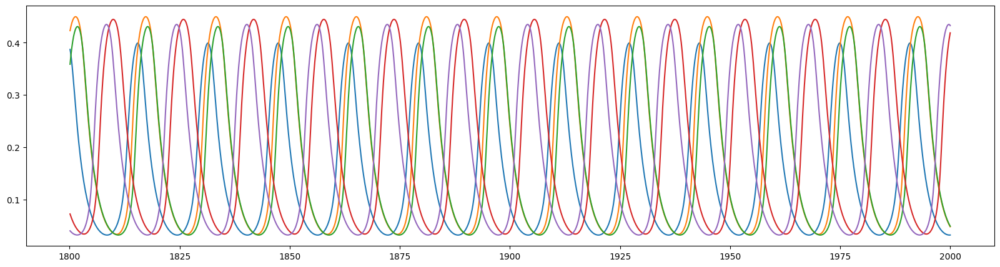

period =  15.940909090909091
period diff =  0.0
amplitudes =  [0.3992078739263362, 0.44962942050795235, 0.4307565687015247, 0.44453976737700546, 0.43489807025157945] 0.44962942050795235 0.3992078739263362
mean dt =  5.368669527896996
----------------
1 2


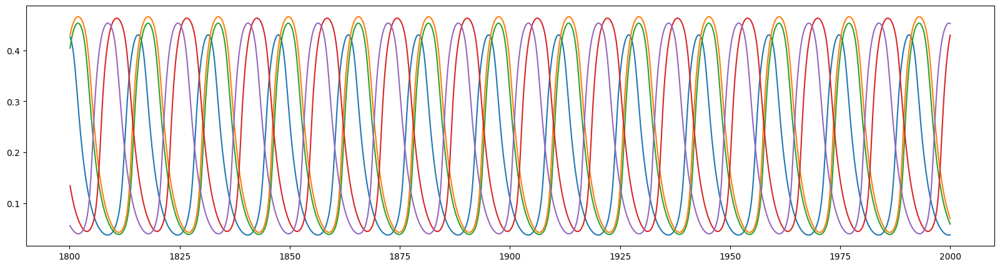

period =  15.91818181818182
period diff =  -0.004545454545452188
amplitudes =  [0.43062928792876143, 0.46627097223840586, 0.4535326965772422, 0.46339571351158904, 0.45367918094883136] 0.46627097223840586 0.43062928792876143
mean dt =  5.276793248945148
----------------
2 0


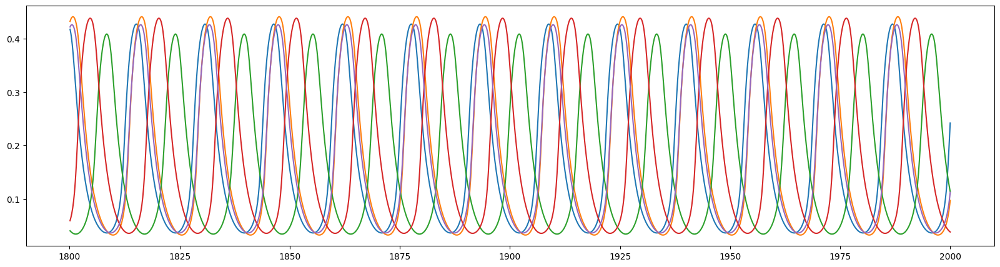

period =  15.613636363636363
period diff =  0.0005928853754930685
amplitudes =  [0.42746456242074565, 0.4412468289173768, 0.4087874851796296, 0.4384132369845205, 0.42624020442413346] 0.4412468289173768 0.4087874851796296
mean dt =  3.2652719665271968
----------------
2 1


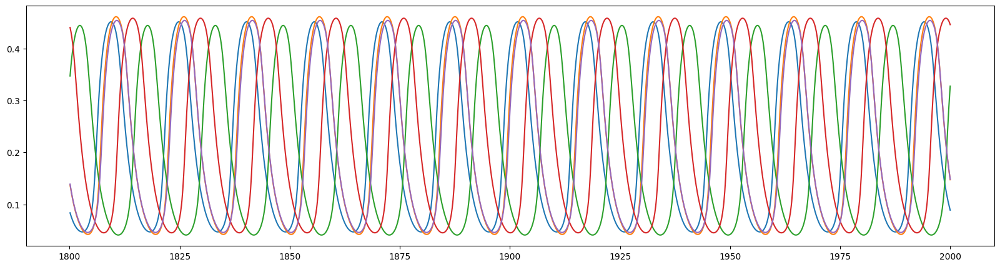

period =  15.391304347826088
period diff =  0.0
amplitudes =  [0.4513257835330808, 0.4611948599041516, 0.44432670882170844, 0.45826499569907536, 0.4540007768756008] 0.4611948599041516 0.44432670882170844
mean dt =  3.023140495867769
----------------
2 2


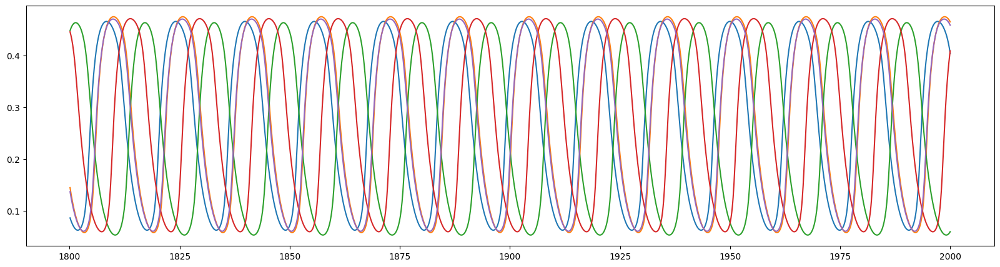

period =  15.730434782608697
period diff =  -0.001383399209485603
amplitudes =  [0.46557070632631975, 0.47467741131778496, 0.46316331074916145, 0.4709214848722538, 0.47014761728067805] 0.47467741131778496 0.46316331074916145
mean dt =  3.980701754385965


In [232]:
plt_list = []
mean_dt = np.zeros((len(cmats), len(points)))
i0, i1 = 18000, 20000

for c in range(len(cmats)):
    model = WCModel(Cmat=cmats[c], Dmat=dmats[c])

    dt = model.params['dt']
    model.params['duration'] = 2. * 1000
    model.params.signalV = 1.

    zero_input = ZeroInput().generate_input(duration=model.params['duration']+model.params.dt, dt=model.params.dt)
    rect_input = np.vstack( (zero_input)*2 )
    rect_input[0,:500] = -5.
    rect_input[0,10000:10500] = 5.

    for pind in range(len(points)):
        print("----------------")
        print(c, pind)
        model.params["exc_ext"] = points[pind][0] + rect_input[0,:]
        model.params["inh_ext"] = points[pind][1]
        model.run()

        if [c, pind] in plt_list or True:
            fig, ax = plt.subplots(figsize=(20,5))
            for n in range(N):
                ax.plot(model.t[i0:i1], model.exc[n,i0:i1], color=colors[n])
            plt.show()

        periods_array[c, pind] = getperiod(model.exc[:,-4000:], dt)
        print("period = ", periods_array[c, pind])
        alt_period = getperiod(model.exc[:,6000:10000], dt)
        print("period diff = ", periods_array[c, pind] - alt_period)

        amps = []
        for n in range(N):
            amps.append(np.amax(model.exc[n,-1000:]))

        print("amplitudes = ", amps, np.amax(amps), np.amin(amps))

        timings = []
        for n in range(N):
            timings.append(scipy.signal.find_peaks(model.exc[n,-10000:])[0])

        list_mean_dt = []
        for n1 in range(N):
            list_dt = []
            for n2 in range(N):
                if n1 == n2:
                    continue
                for ti in timings[n2][1:-2]:
                    list_dt.append(np.amin(np.abs(timings[n1] - ti)))

            list_mean_dt = np.mean(list_dt)

        #print(list_dt)

        mean_dt[c, pind] = np.amin(list_mean_dt) * model.params.dt
        print("mean dt = ", mean_dt[c, pind])


In [153]:
controlmat = np.zeros((N,2))
controlmat[:,0] = 1.

costmat = np.zeros((N, 2))
costmat[:,0] = 1.

duration = 200.
model.params.duration = duration
zero_input0 = ZeroInput().generate_input(duration=duration+model.params.dt, dt=model.params.dt)
zero_input = np.vstack( ([zero_input0]*2) )[np.newaxis,:,:]
zero_control = np.vstack( ([zero_input]*N))

w2_n = 8

results = dict()
results["controls"] = [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["periods"] =  [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["timings"] =  [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["states"] =   [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["nat_periods"] =  np.zeros((len(cmats), len(points), 4, w2_n))
results["w2"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["L2cost"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["distance"] = np.zeros((len(cmats), len(points), 4, w2_n ))

In [65]:
results["nat_periods"] =  np.zeros((len(cmats), len(points), 4, w2_n))
results["w2"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["L2cost"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["distance"] = np.zeros((len(cmats), len(points), 4, w2_n ))

In [154]:
print(results["periods"])

[[[[None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None]], [[None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None]], [[None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None]]], [[[None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None]], [[None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, None, None], [None, None, None, None, None, None, 

c =  0
pind =  0
target period =  17.689473684210526
imet =  0
Optimal control with target oscillation period
L2 cost =  602.0326555868445
Compute control for a deterministic system
Cost in iteration 0: -0.9862557118197688
Converged in iteration 2 with cost -0.9862557118197688
Final cost : -0.9862557118197688


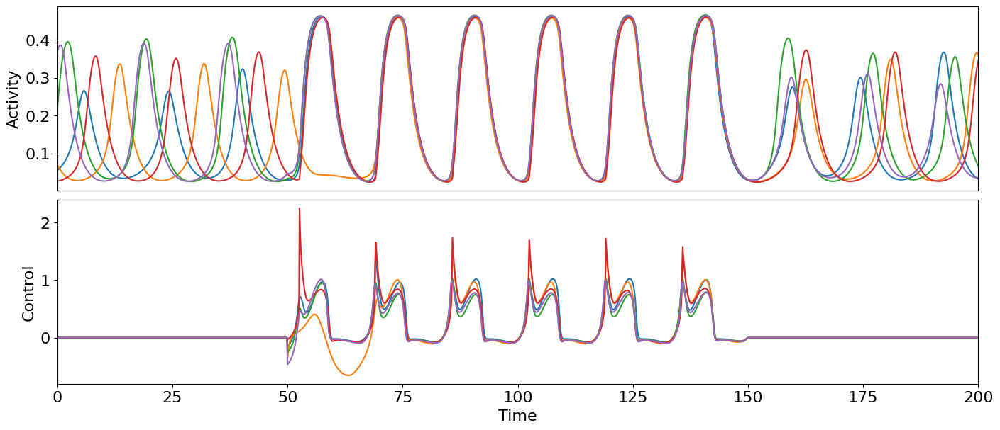

imet =  1
Optimal control with target oscillation period
L2 cost =  627.26256228572
Compute control for a deterministic system
Cost in iteration 0: -1.567577999055656
Converged in iteration 1 with cost -1.567577999055656
Final cost : -1.567577999055656


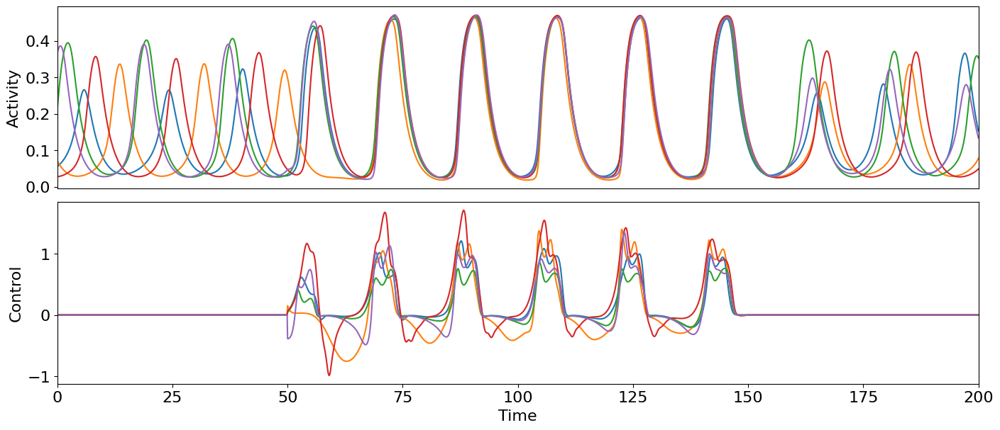

imet =  2
Optimal control with target oscillation period
L2 cost =  32.86112151443675
Compute control for a deterministic system
Cost in iteration 0: -2118.0360889535286
Converged in iteration 10 with cost -2118.504912549207
Final cost : -2118.504912549207


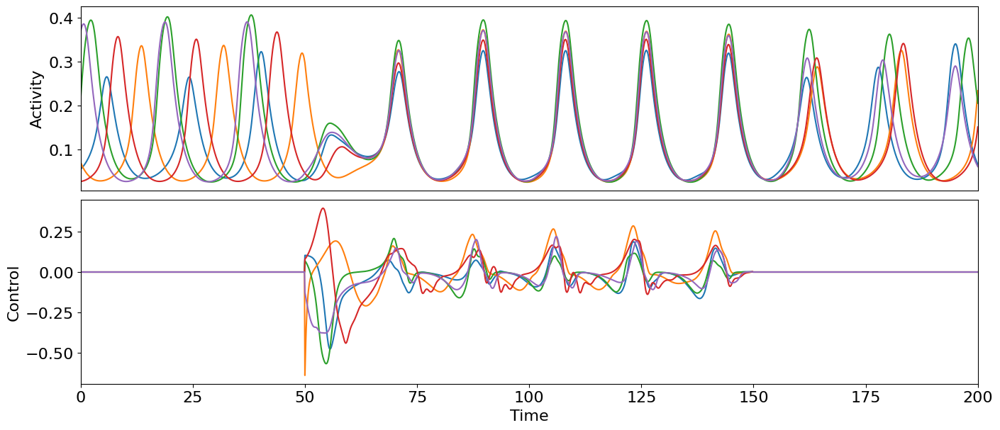

imet =  3
Optimal control with target oscillation period
L2 cost =  24.542559783142003
Compute control for a deterministic system
Cost in iteration 0: 0.012793306243840358
Converged in iteration 2 with cost 0.012793306243840358
Final cost : 0.012793306243840358


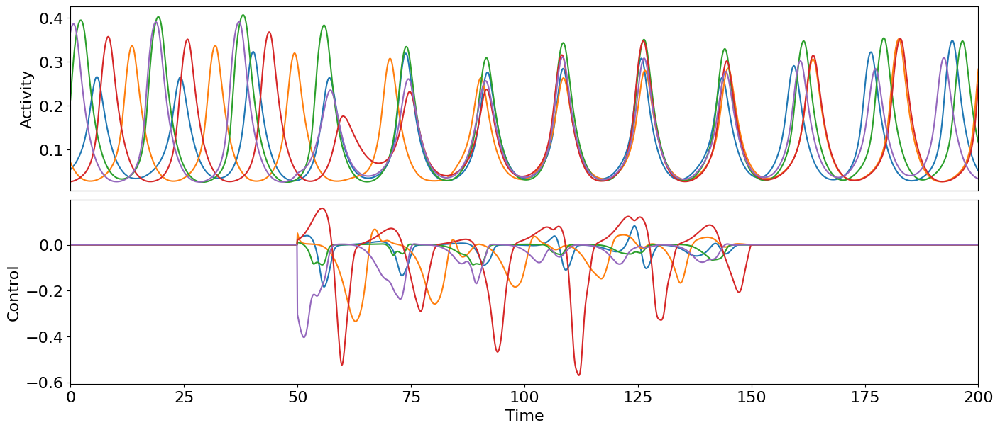

pind =  1
target period =  16.78095238095238
imet =  0
Optimal control with target oscillation period
L2 cost =  724.5690027097471
Compute control for a deterministic system
Cost in iteration 0: -1.128519270260214
Converged in iteration 2 with cost -1.128519270260214
Final cost : -1.128519270260214


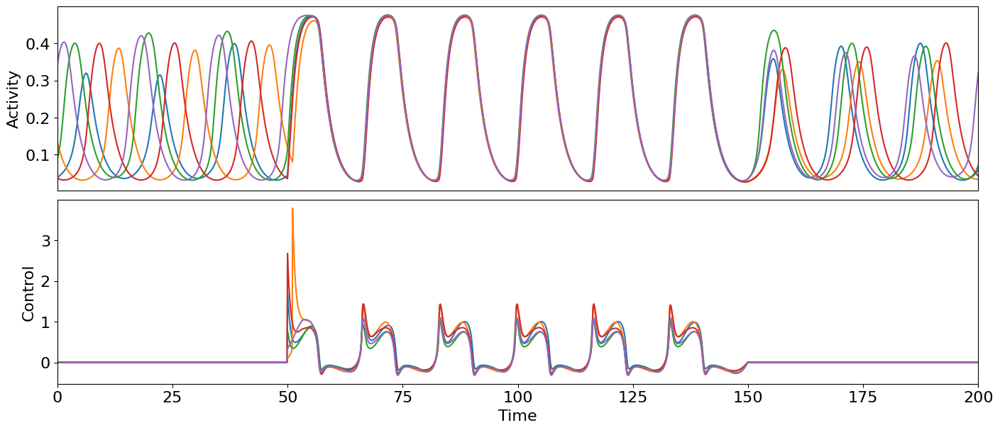

imet =  1
Optimal control with target oscillation period
L2 cost =  663.0529439888304
Compute control for a deterministic system
Cost in iteration 0: -1.651214017505459
Converged in iteration 1 with cost -1.651214017505459
Final cost : -1.651214017505459


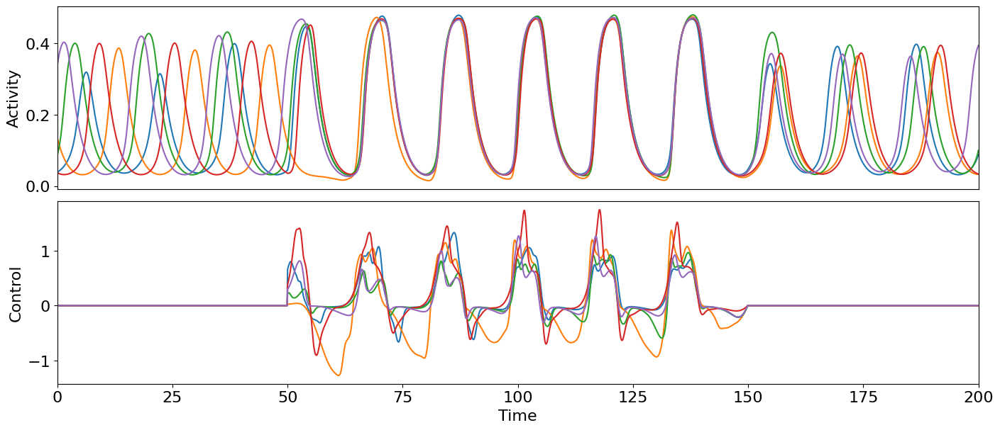

imet =  2
Optimal control with target oscillation period
L2 cost =  41.1716603327165
Compute control for a deterministic system
Cost in iteration 0: -2003.2355675018862
Converged in iteration 9 with cost -2003.4368091422784
Final cost : -2003.4368091422784


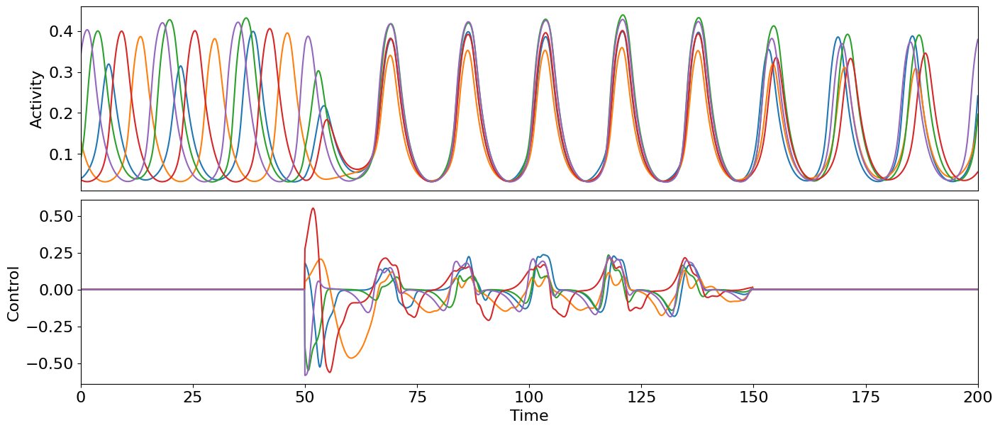

imet =  3
Optimal control with target oscillation period
L2 cost =  51.699752919247906
Compute control for a deterministic system
Cost in iteration 0: 0.023623792871133135
Converged in iteration 9 with cost 0.023623792871132913
Final cost : 0.023623792871132913


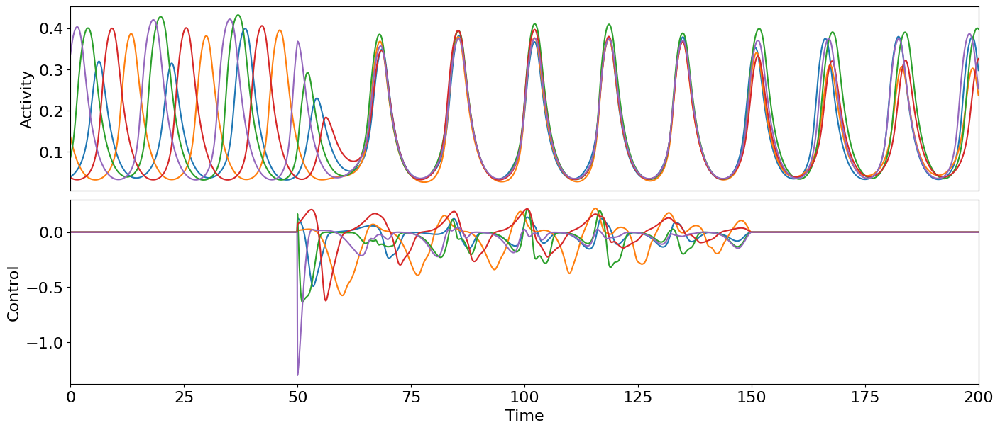

pind =  2
target period =  16.485714285714288
imet =  0
Optimal control with target oscillation period
L2 cost =  571.5330488436326
Compute control for a deterministic system
Cost in iteration 0: -1.153596392373496
Converged in iteration 6 with cost -1.153596392373496
Final cost : -1.153596392373496


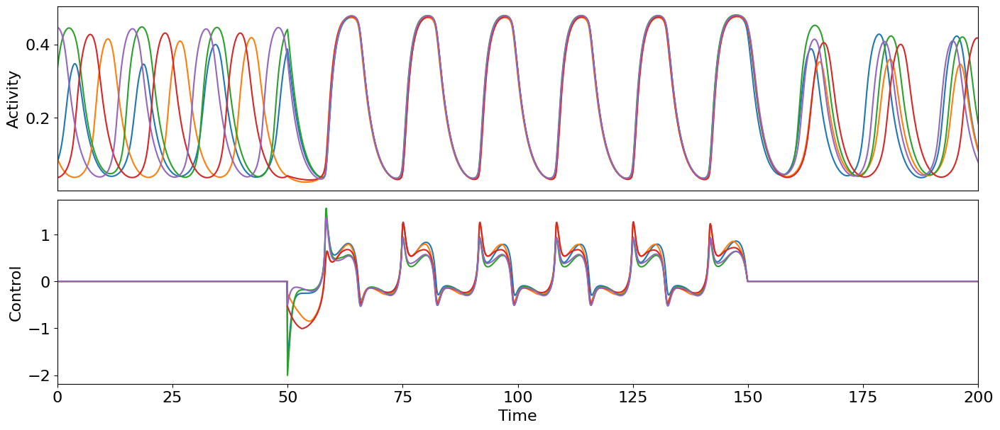

imet =  1
Optimal control with target oscillation period
L2 cost =  720.4228943212506
Compute control for a deterministic system
Cost in iteration 0: -1.7905644334812203
Converged in iteration 1 with cost -1.7905644334812203
Final cost : -1.7905644334812203


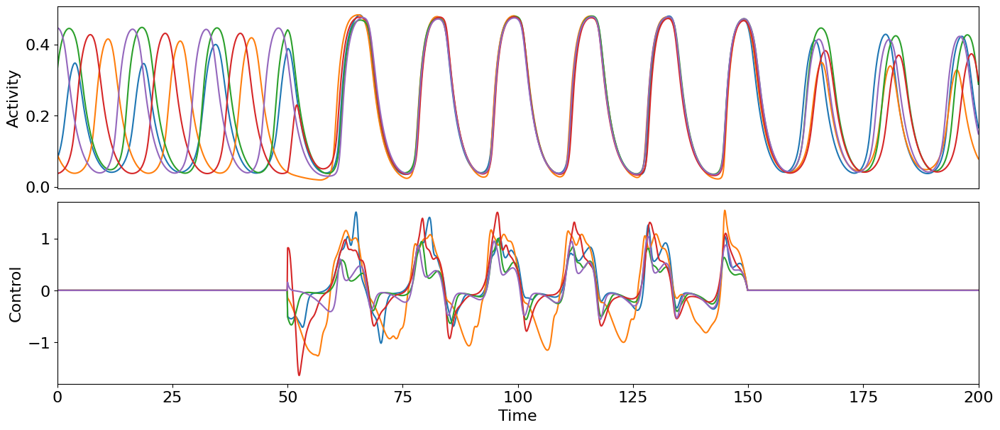

imet =  2
Optimal control with target oscillation period
L2 cost =  35.527144061407675
Compute control for a deterministic system
Cost in iteration 0: -2072.4007464821366
Cost in iteration 10: -2072.4007464823394
Converged in iteration 11 with cost -2072.4007464823394
Final cost : -2072.4007464823394


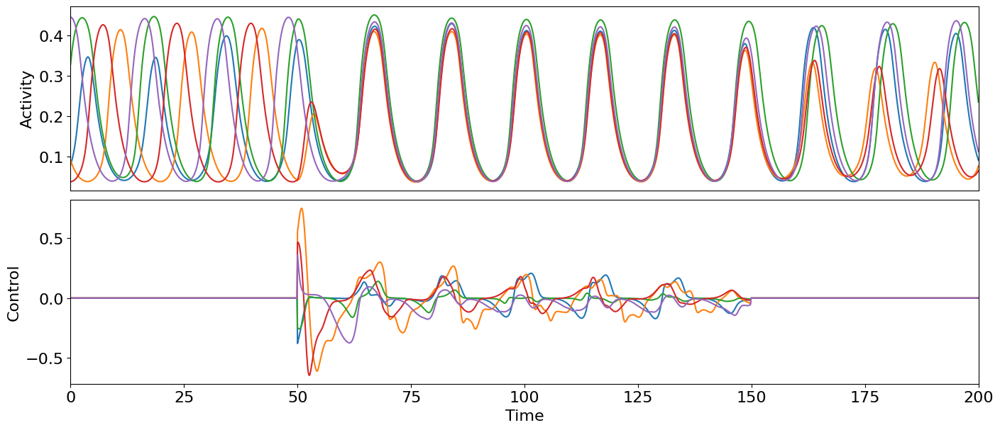

imet =  3
Optimal control with target oscillation period
L2 cost =  100.45552148269624
Compute control for a deterministic system
Cost in iteration 0: 0.04912383975715249
Converged in iteration 7 with cost 0.04912383975715253
Final cost : 0.04912383975715253


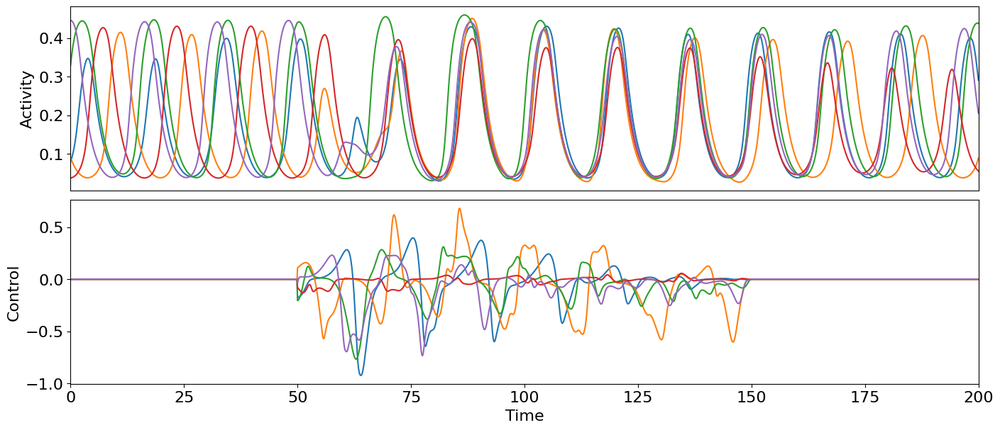

c =  1
pind =  0
target period =  16.400000000000002
imet =  0
Optimal control with target oscillation period
L2 cost =  604.5990322921564
Compute control for a deterministic system
Cost in iteration 0: -1.0240210773268736
Converged in iteration 1 with cost -1.0240210773268736
Final cost : -1.0240210773268736


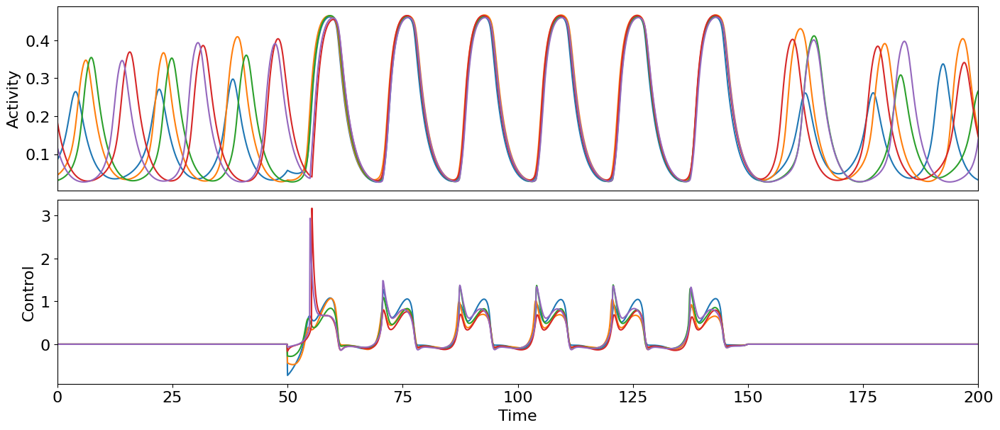

imet =  1
Optimal control with target oscillation period
L2 cost =  259.66767482099567
Compute control for a deterministic system
Cost in iteration 0: -1.2306349350243981
Converged in iteration 1 with cost -1.2306349350243981
Final cost : -1.2306349350243981


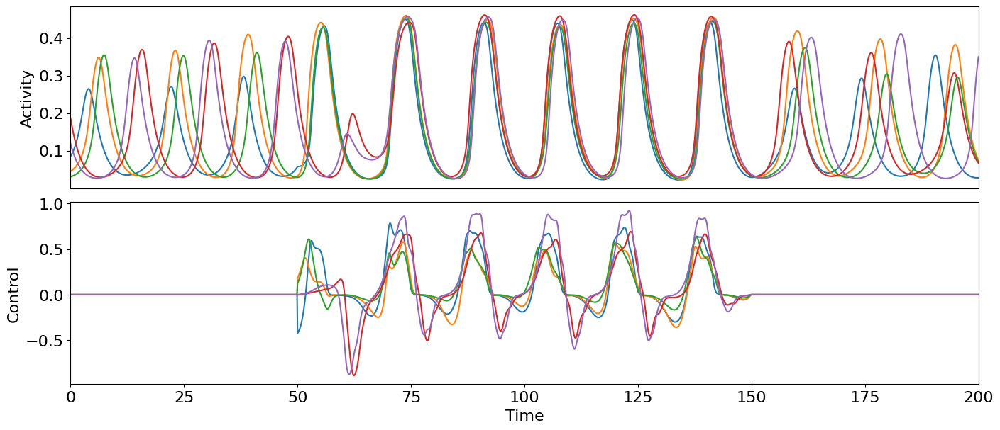

imet =  2
Optimal control with target oscillation period
L2 cost =  46.99615945700032
Compute control for a deterministic system
Cost in iteration 0: -1965.0007466323873
Cost in iteration 10: -1965.5928020661936
Cost in iteration 20: -1966.0416196254325
Cost in iteration 30: -1966.4829168172816
Cost in iteration 40: -1967.020306296219
Cost in iteration 50: -1967.30809349662
Cost in iteration 60: -1967.7449267720472
Cost in iteration 70: -1968.1877749442874
Cost in iteration 80: -1968.489596227834
Cost in iteration 90: -1968.9607338924504
Cost in iteration 100: -1969.9600600407462
Cost in iteration 110: -1970.1697564783483
Cost in iteration 120: -1970.607245034604
Cost in iteration 130: -1970.9741377271625
Cost in iteration 140: -1971.3674389236494
Cost in iteration 150: -1971.910436682646
Cost in iteration 160: -1972.1526115591432
Cost in iteration 170: -1972.3965647259733
Cost in iteration 180: -1972.7112368754774
Cost in iteration 190: -1973.05501300252
Cost in iteration 200: -1973.2

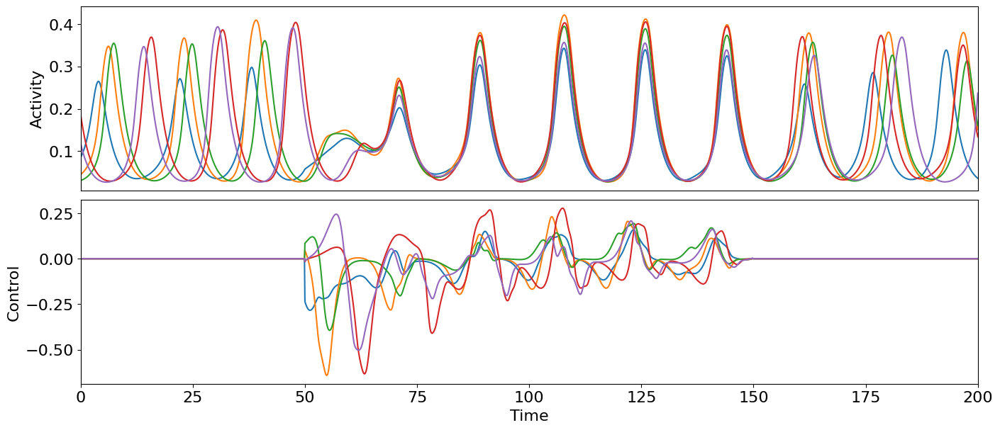

imet =  3
Optimal control with target oscillation period
L2 cost =  47.69030306627744
Compute control for a deterministic system
Cost in iteration 0: 0.11185555815855638
Converged in iteration 1 with cost 0.11185555815855638
Final cost : 0.11185555815855638


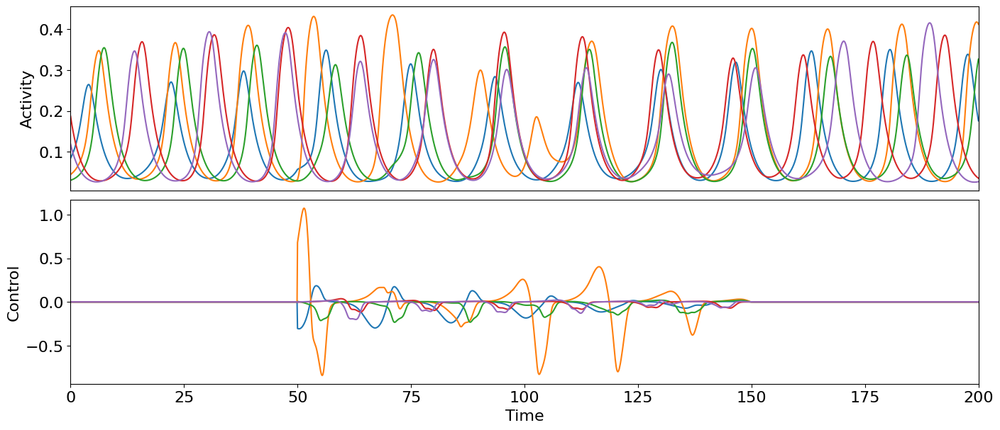

pind =  1
target period =  15.940909090909091
imet =  0
Optimal control with target oscillation period
L2 cost =  673.8955818146899
Compute control for a deterministic system
Cost in iteration 0: -1.1231206519932437
Converged in iteration 2 with cost -1.1231206519932437
Final cost : -1.1231206519932437


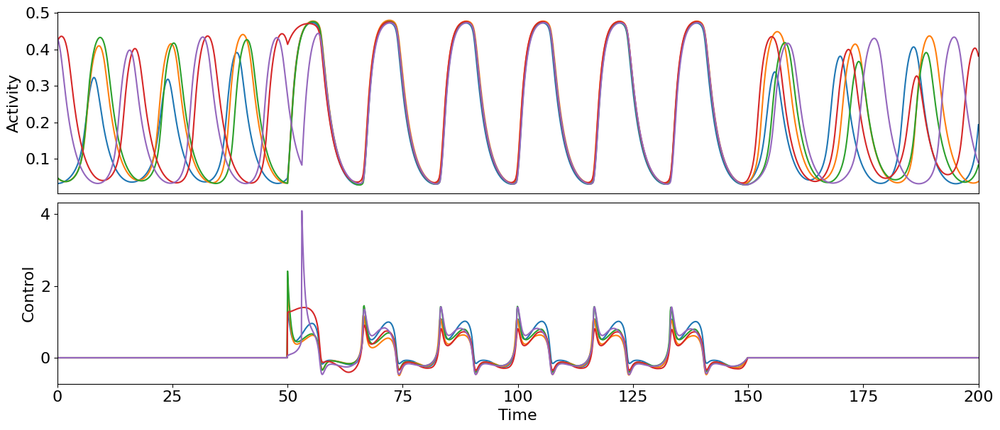

imet =  1
Optimal control with target oscillation period
L2 cost =  608.6943251886241
Compute control for a deterministic system
Cost in iteration 0: -1.7141723005026352
Converged in iteration 1 with cost -1.7141723005026352
Final cost : -1.7141723005026352


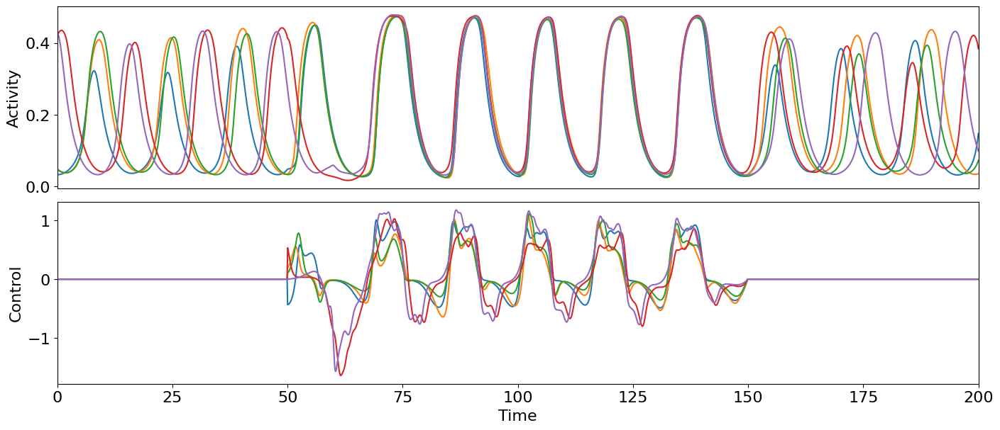

imet =  2
Optimal control with target oscillation period
L2 cost =  67.07111884911679
Compute control for a deterministic system
Cost in iteration 0: -1684.9080012629552
Cost in iteration 10: -1685.0247998551094
Converged in iteration 17 with cost -1685.129383933474
Final cost : -1685.129383933474


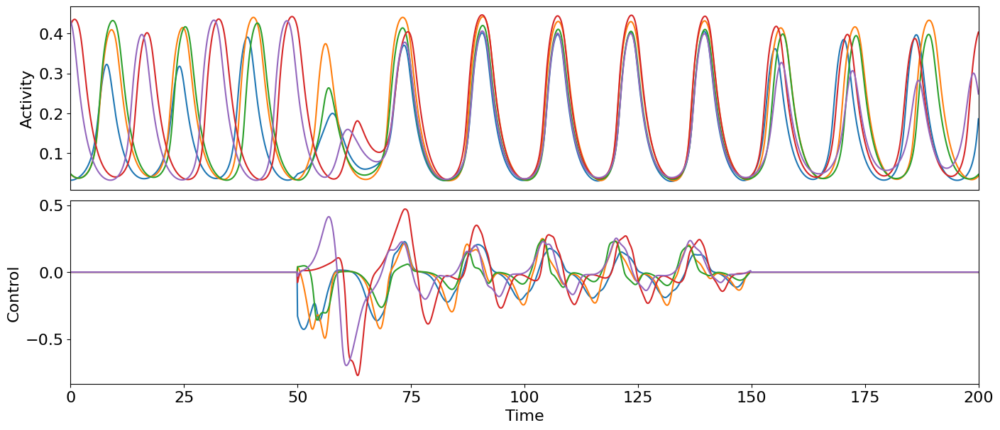

imet =  3
Optimal control with target oscillation period
L2 cost =  41.2641539018039
Compute control for a deterministic system
Cost in iteration 0: 0.1656871425549851
Converged in iteration 6 with cost 0.16568714255498485
Final cost : 0.16568714255498485


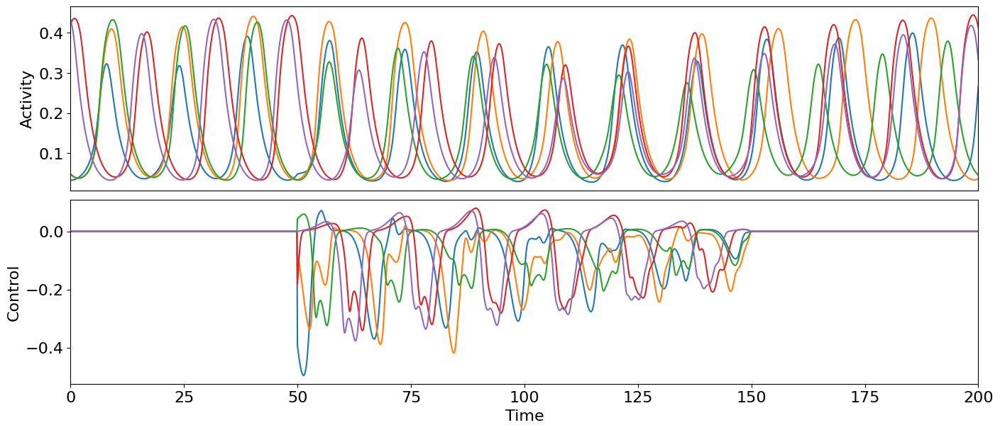

pind =  2
target period =  15.91818181818182
imet =  0
Optimal control with target oscillation period
L2 cost =  534.2617410074005
Compute control for a deterministic system
Cost in iteration 0: -1.1515157162818543
Converged in iteration 5 with cost -1.1515157162818546
Final cost : -1.1515157162818546


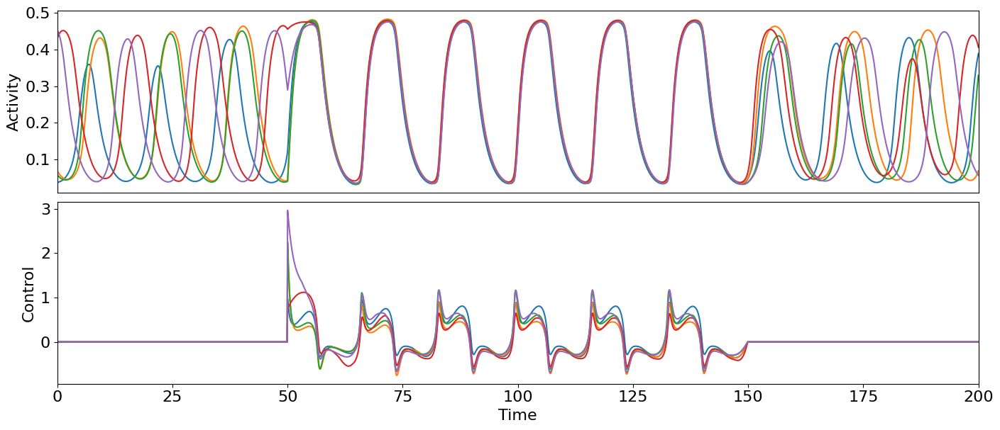

imet =  1
Optimal control with target oscillation period
L2 cost =  416.87369866652546
Compute control for a deterministic system
Cost in iteration 0: -1.9972882592145185
Cost in iteration 10: -1.9972882592145185
Converged in iteration 11 with cost -1.9972882592145185
Final cost : -1.9972882592145185


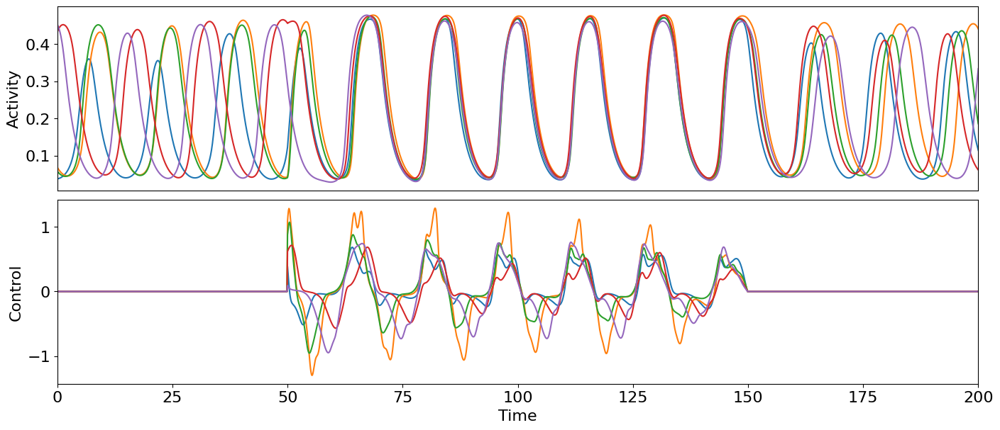

imet =  2
Optimal control with target oscillation period
L2 cost =  76.61559034661002
Compute control for a deterministic system
Cost in iteration 0: -1668.1611060137425
Converged in iteration 1 with cost -1668.1611060137425
Final cost : -1668.1611060137425


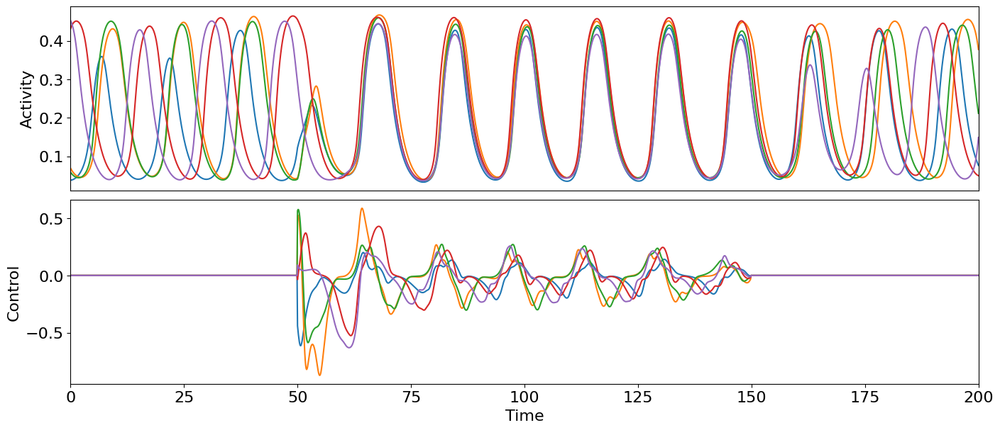

imet =  3
Optimal control with target oscillation period
L2 cost =  127.86339969178161
Compute control for a deterministic system
Cost in iteration 0: 0.08702185560804018
Converged in iteration 1 with cost 0.08702185560804018
Final cost : 0.08702185560804018


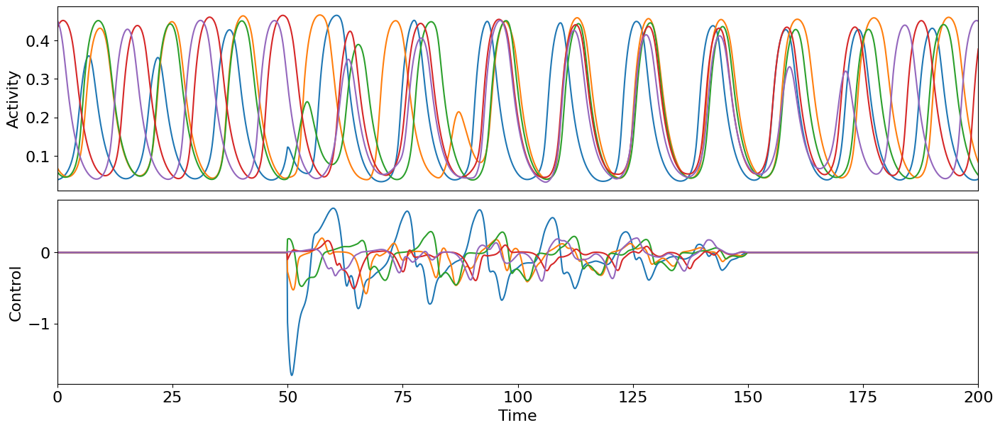

c =  2
pind =  0
target period =  15.613636363636363
imet =  0
Optimal control with target oscillation period
L2 cost =  673.922992936896
Compute control for a deterministic system
Cost in iteration 0: -1.1398801042980042
Converged in iteration 9 with cost -1.1398801042980042
Final cost : -1.1398801042980042


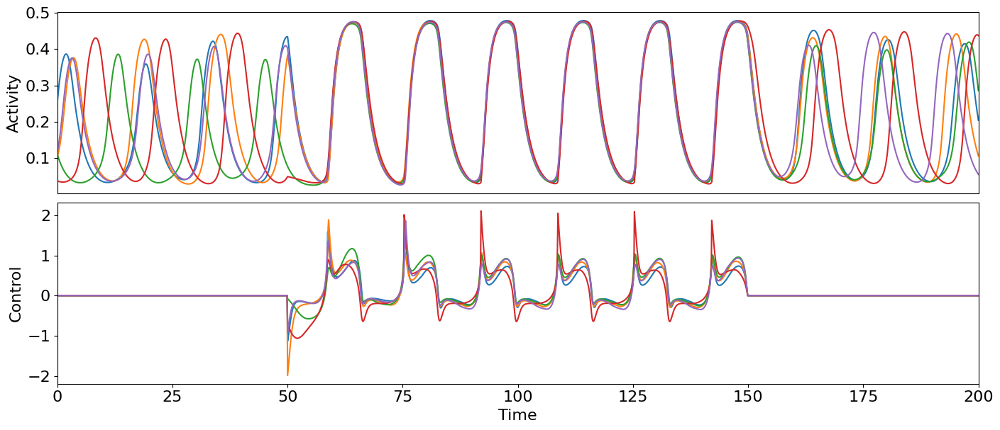

imet =  1
Optimal control with target oscillation period
L2 cost =  524.9582680036326
Compute control for a deterministic system
Cost in iteration 0: -1.8896209245660684
Converged in iteration 1 with cost -1.8896209245660684
Final cost : -1.8896209245660684


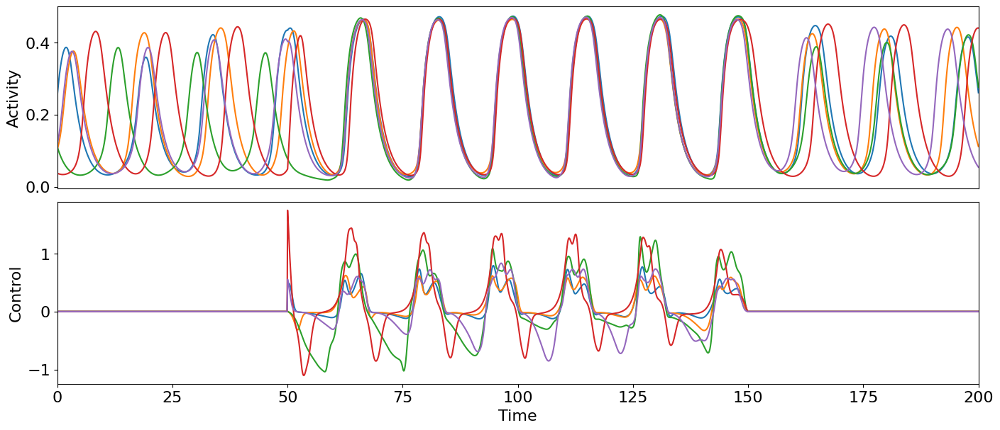

imet =  2
Optimal control with target oscillation period
L2 cost =  55.187371872557335
Compute control for a deterministic system
Cost in iteration 0: -1838.766940819089
Converged in iteration 7 with cost -1838.7749460724629
Final cost : -1838.7749460724629


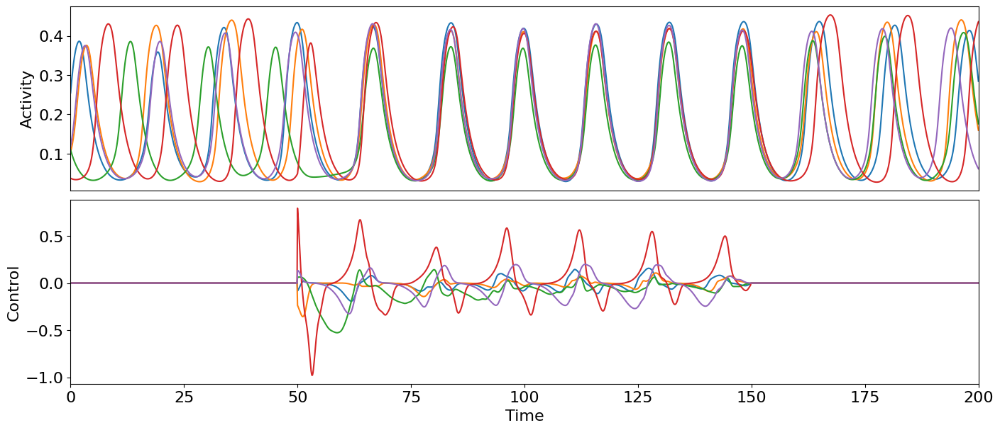

imet =  3
Optimal control with target oscillation period
L2 cost =  74.92631563543034
Compute control for a deterministic system
Cost in iteration 0: 0.016661272157719613
Converged in iteration 1 with cost 0.016661272157719613
Final cost : 0.016661272157719613


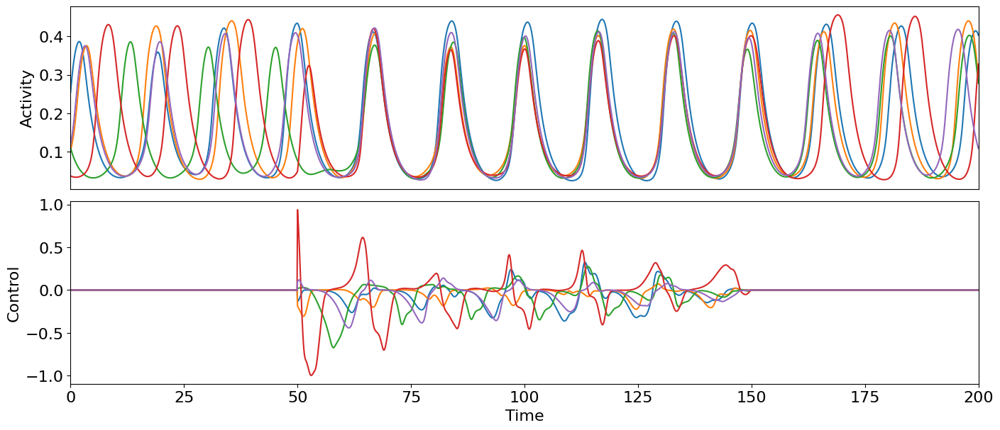

pind =  1
target period =  15.391304347826088
imet =  0
Optimal control with target oscillation period
L2 cost =  492.6300452227662
Compute control for a deterministic system
Cost in iteration 0: -1.1526048620547313
Converged in iteration 2 with cost -1.1526048620547313
Final cost : -1.1526048620547313


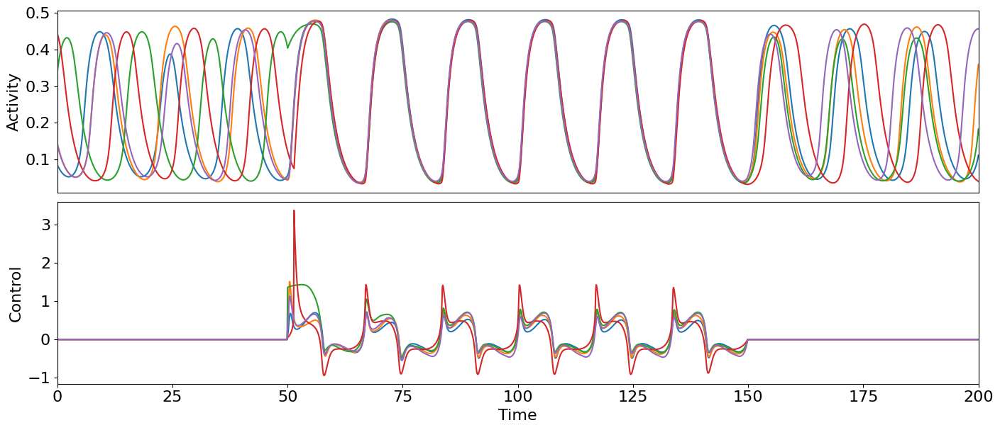

imet =  1
Optimal control with target oscillation period
L2 cost =  410.5253731593238
Compute control for a deterministic system
Cost in iteration 0: -2.4809535459029806
Converged in iteration 2 with cost -2.4809535459029806
Final cost : -2.4809535459029806


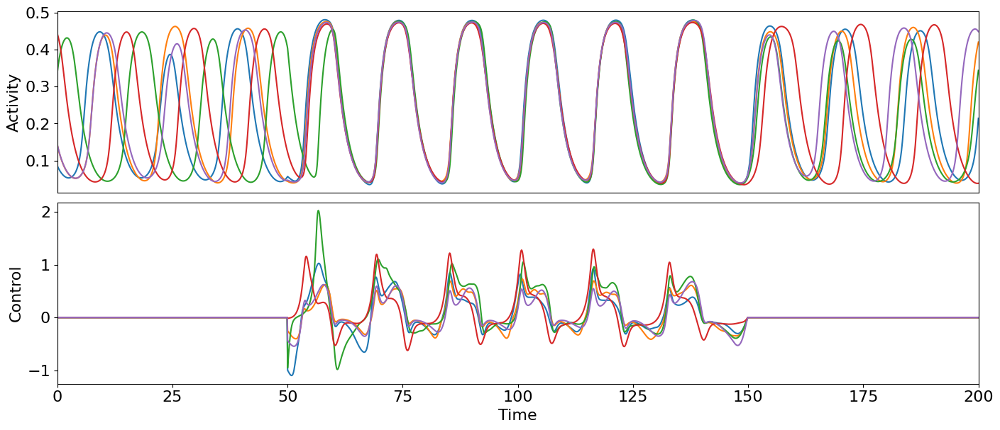

imet =  2
Optimal control with target oscillation period
L2 cost =  61.87227468070641
Compute control for a deterministic system
Cost in iteration 0: -1777.2732421748947
Converged in iteration 1 with cost -1777.2732421748947
Final cost : -1777.2732421748947


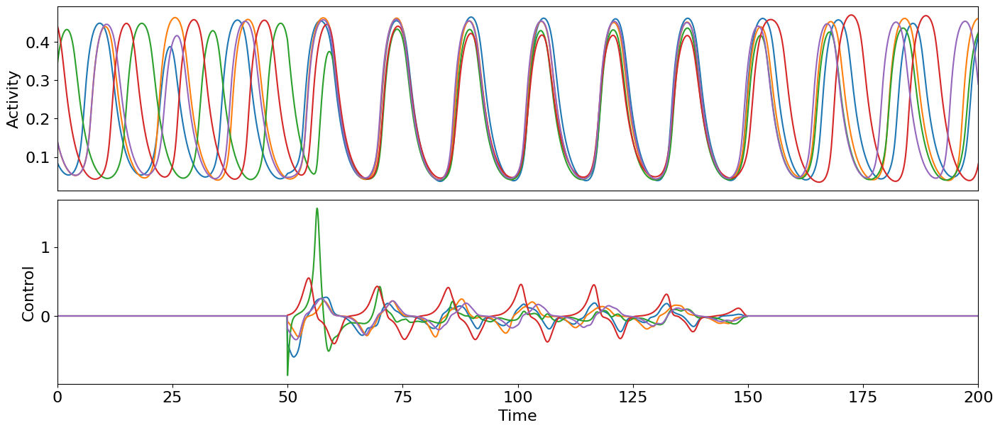

imet =  3
Optimal control with target oscillation period
L2 cost =  47.126650901594246
Compute control for a deterministic system
Cost in iteration 0: 0.04760766592329102
Converged in iteration 2 with cost 0.04760766592329102
Final cost : 0.04760766592329102


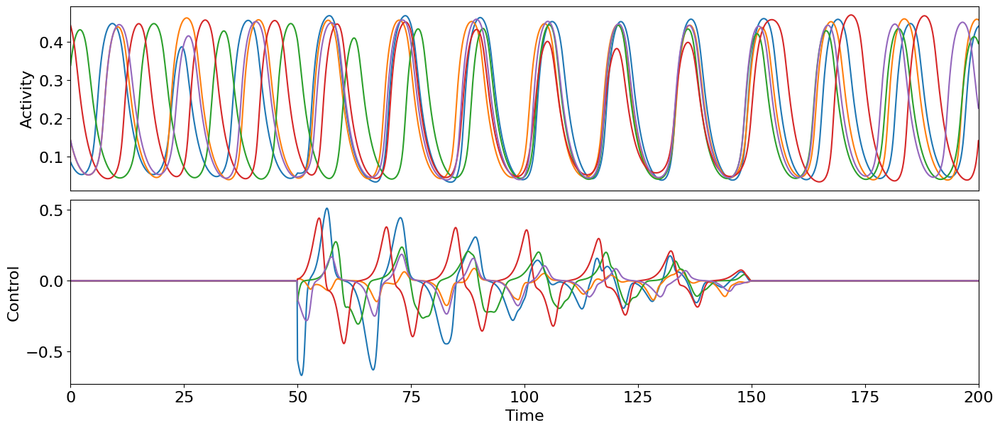

pind =  2
target period =  15.730434782608697
imet =  0
Optimal control with target oscillation period
L2 cost =  436.0224421060022
Compute control for a deterministic system
Cost in iteration 0: -1.161042737468996
Converged in iteration 2 with cost -1.161042737468996
Final cost : -1.161042737468996


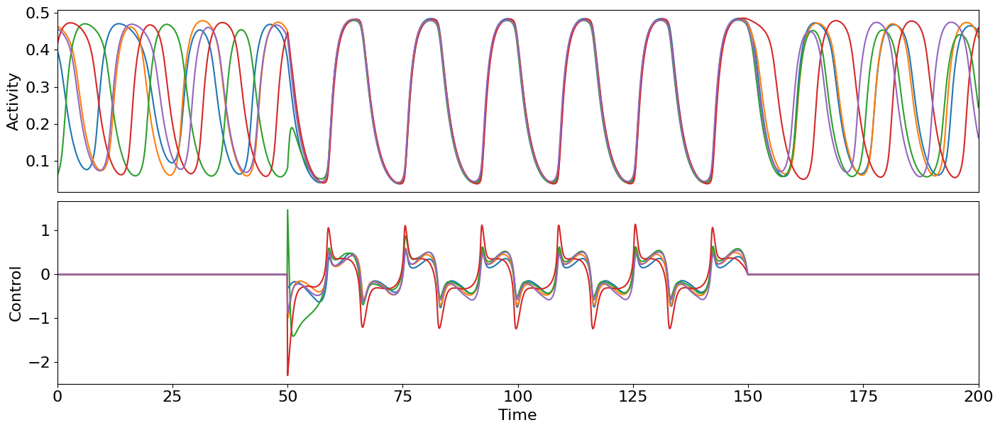

imet =  1
Optimal control with target oscillation period
L2 cost =  745.4350469516908
Compute control for a deterministic system
Cost in iteration 0: -2.7939703924465538
Converged in iteration 1 with cost -2.7939703924465538
Final cost : -2.7939703924465538


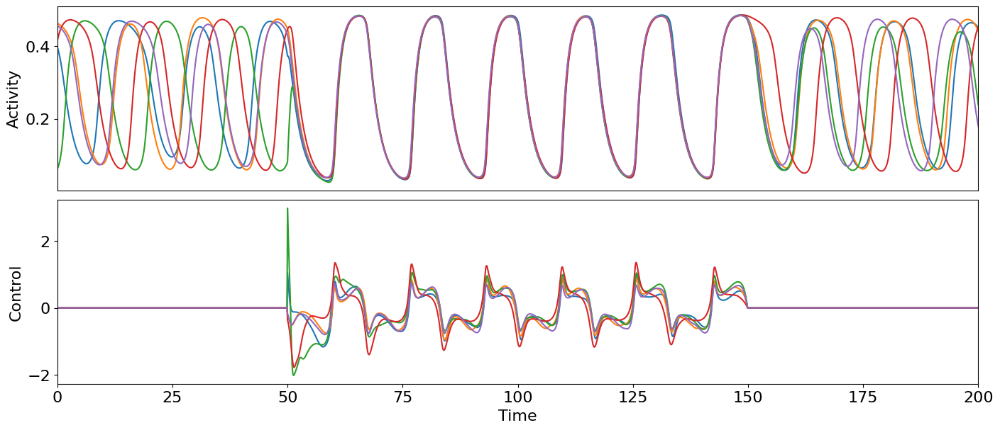

imet =  2
Optimal control with target oscillation period
L2 cost =  62.758734861296006
Compute control for a deterministic system
Cost in iteration 0: -1709.5553937180534
Converged in iteration 1 with cost -1709.5553937180534
Final cost : -1709.5553937180534


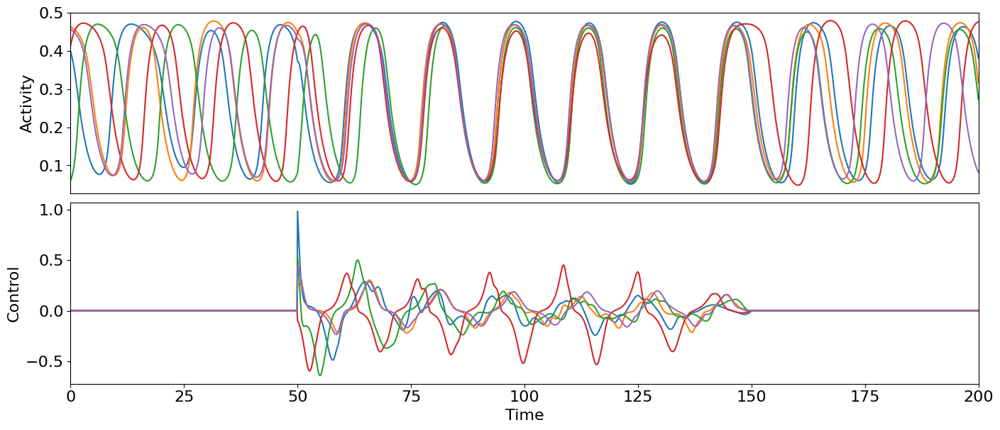

imet =  3
Optimal control with target oscillation period
L2 cost =  79.52256900776314
Compute control for a deterministic system
Cost in iteration 0: 0.04683939553877567
Converged in iteration 1 with cost 0.04683939553877567
Final cost : 0.04683939553877567


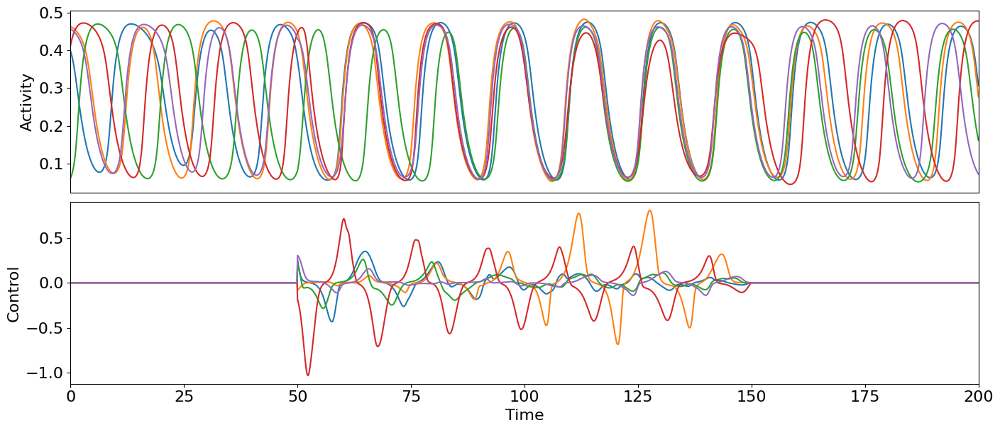

In [174]:
it = 2000
pr = np.arange(0,2001,10)
maxstr = 10.
init_control = zero_control.copy()
LIMC = [400., 800.]
dir = "images_5n_sim"

skip_array = [ ]

for c in range(len(cmats)):
    print("c = ", c)

    model = WCModel(Cmat=cmats[c], Dmat=dmats[c])

    dt = model.params['dt']
    model.params.signalV = 1.

    nmaxdel = model.getMaxDelay()

    for pind in range(len(points)):

        print("pind = ", pind)

        if [c, pind] in skip_array:
            continue

        p = points[pind]
        
        testd = 1000.
        model.params.duration = testd
        test_input = ZeroInput().generate_input(duration=testd+dt, dt=dt)
        test_input[0,:500] = 5.
        model.params["exc_ext"] = test_input + p[0]
        model.params["inh_ext"] = test_input + p[1]

        einit = np.zeros((N, nmaxdel+1))
        iinit = np.zeros((N, nmaxdel+1))

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit
        model.run()

        for n in range(N):
            einit[n,:] = model.exc[n,-1]
            iinit[n,:] = model.inh[n,-1]

        model.params.duration = duration

        model.params["exc_ext"] = zero_control[:,0,:] + p[0]
        model.params["inh_ext"] = zero_control[:,0,:] + p[1]

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit

        model.run()
            
        int0 = 500
        int1 = 1500

        print("target period = ", periods_array[c, pind])

        for imet in range(4):

            for wind in [0]:

                print("imet = ", imet)

                w2 = results["w2"][c, pind, imet, wind]
                    
                if w2 == 0:
                    w2 = 1e-3
                    if imet == 2:
                        w2 = 1e2

                model_controlled = oc_wc.OcWc(model, periods_array[c, pind], print_array=pr, cost_interval=(int0,int1), control_interval=(int0,int1), cost_matrix=costmat, control_matrix = controlmat)
                model_controlled.maximum_control_strength = maxstr
                model_controlled.channelwise_optimization = True
                model_controlled.step = 1e-2
                model_controlled.weights["w_p"] = 0.
                model_controlled.weights["w_2"] = w2

                if imet == 0:
                    model_controlled.weights["w_f_sync"] = 1.
                elif imet == 1:
                    model_controlled.weights["w_cc"] = 1.
                elif imet == 2:
                    model_controlled.weights["w_cc1"] = 1.
                elif imet == 3:
                    model_controlled.weights["w_var"] = 1.

                if type(results["controls"][c][pind][imet][wind]) != type(None):
                    model_controlled.control = results["controls"][c][pind][imet][wind].copy()
                    model_controlled.update_input()

                if results["w2"][c, pind, imet, wind] == 0:
                    model_controlled.optimize(60)
                    #fname = str(c) + "_" + str(pind) + "_" + str(imet) + "_" + str(wind) + ".png"
                    #plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

                L2cost = np.sum(cost_functions.L2_cost(model_controlled.control))
                print("L2 cost = ", L2cost)

                while L2cost > LIMC[1]:
                    w2 *= 2.
                    model_controlled.weights["w_2"] = w2
                    print("control too strong, increase w2 to ", w2)
                    
                    model_controlled.control = zero_control
                    model_controlled.update_input()
                    model_controlled.step = 1e-2
                    model_controlled.zero_step_encountered = False
                    model_controlled.optimize(40)
                    L2cost = np.sum(cost_functions.L2_cost(model_controlled.control))
                    print("L2 cost = ", L2cost)

                    #fname = str(c) + "_" + str(pind) + "_" + str(imet) + "_" + str(wind) + ".png"
                    #plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

                model_controlled.optimize(it)

                results["controls"][c][pind][imet][wind] = model_controlled.control.copy()
                state = model_controlled.get_xs()
                results["states"][c][pind][imet][wind] = state

                timings, periods = getperiods(state, dt, N, interval=(int0, int1))
                results["timings"][c][pind][imet][wind] = timings
                results["periods"][c][pind][imet][wind] = periods
                results["nat_periods"][c, pind, imet, wind] = periods_array[c, pind]
                results["distance"][c, pind, imet, wind] = get_sim(state, N, periods_array[c, pind]/dt)
                results["w2"][c, pind, imet, wind] = w2
                results["L2cost"][c, pind, imet, wind] = np.sum(cost_functions.L2_cost(model_controlled.control))

                fname = str(c) + "_" + str(pind) + "_" + str(imet) + "_" + str(wind) + ".png"
                plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

        # save after each cmat point
        with open('snyc_5n_sim.pickle', 'wb') as f:
            pickle.dump(results, f)

In [248]:
it = 100
pr = np.arange(0,2001,100)
maxstr = 10.
init_control = zero_control.copy()
LIMC = 1.

for c in range(len(cmats)):
    print("c = ", c)

    model = WCModel(Cmat=cmats[c], Dmat=dmats[c])

    dt = model.params['dt']
    model.params.signalV = 1.

    nmaxdel = model.getMaxDelay()

    for pind in range(len(points)):

        print("pind = ", pind)

        if [c, pind] in skip_array:
            continue

        p = points[pind]
        
        testd = 1000.
        model.params.duration = testd
        test_input = ZeroInput().generate_input(duration=testd+dt, dt=dt)
        test_input[0,:500] = -5.
        model.params["exc_ext"] = test_input + p[0]
        model.params["inh_ext"] = test_input + p[1]

        einit = np.zeros((N, nmaxdel+1))
        iinit = np.zeros((N, nmaxdel+1))

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit
        model.run()

        for n in range(N):
            einit[n,:] = model.exc[n,-1]
            iinit[n,:] = model.inh[n,-1]

        model.params.duration = duration

        model.params["exc_ext"] = zero_control[:,0,:] + p[0]
        model.params["inh_ext"] = zero_control[:,0,:] + p[1]

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit

        model.run()

        print("target period = ", periods_array[c, pind])

        for imet in range(4):

            if imet not in [0,2,3]:
                continue
            
            for wind in range(w2_n):

                print("imet = ", imet)

                w2 = results["w2"][c, pind, imet, wind]
                    
                if w2 == 0:
                    w2 = results["w2"][c, pind, imet, 0] * (wind+1)
                else:
                    if w2 != results["w2"][c, pind, imet, 0] * (wind+1):
                        print("WARNING: change w2")
                        results["controls"][c][pind][imet][wind] = None
                        w2 = results["w2"][c, pind, imet, 0] * (wind+1)


                model_controlled = oc_wc.OcWc(model, periods_array[c, pind], print_array=pr, cost_interval=(int0,int1), control_interval=(int0,int1), cost_matrix=costmat, control_matrix = controlmat)
                model_controlled.maximum_control_strength = maxstr
                model_controlled.channelwise_optimization = True
                model_controlled.step = 1e-2
                model_controlled.weights["w_p"] = 0.
                model_controlled.weights["w_2"] = w2

                if imet == 0:
                    model_controlled.weights["w_f_sync"] = 1.
                elif imet == 1:
                    model_controlled.weights["w_cc"] = 1.
                elif imet == 2:
                    model_controlled.weights["w_cc1"] = 1.
                elif imet == 3:
                    model_controlled.weights["w_var"] = 1.

                if type(results["controls"][c][pind][imet][wind]) != type(None):
                    model_controlled.control = results["controls"][c][pind][imet][wind].copy()
                    model_controlled.update_input()

                model_controlled.optimize(it)

                results["controls"][c][pind][imet][wind] = model_controlled.control.copy()
                state = model_controlled.get_xs()
                results["states"][c][pind][imet][wind] = state

                timings, periods = getperiods(state, dt, N, interval=(int0+300, int1))
                results["timings"][c][pind][imet][wind] = timings
                results["periods"][c][pind][imet][wind] = periods
                results["nat_periods"][c, pind, imet, wind] = periods_array[c, pind]
                results["distance"][c, pind, imet, wind] = get_sim(state, N, periods_array[c, pind]/dt)
                results["w2"][c, pind, imet, wind] = w2
                results["L2cost"][c, pind, imet, wind] = np.sum(cost_functions.L2_cost(model_controlled.control))

                #fname = str(c) + "_" + str(pind) + "_" + str(imet) + "_" + str(wind) + ".png"
                #plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

        # save after each cmat point
        with open('snyc_5n_sim.pickle', 'wb') as f:
            pickle.dump(results, f)

c =  0
pind =  0
target period =  17.689473684210526
imet =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.0314714027342466
Converged in iteration 2 with cost -1.0314714027342466
Final cost : -1.0314714027342466
imet =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.9361641609754006
Converged in iteration 5 with cost -0.9361641609754007
Final cost : -0.9361641609754007
imet =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8782705112146999
Converged in iteration 2 with cost -0.8782705112146999
Final cost : -0.8782705112146999
imet =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.8367365071319474
Converged in iteration 1 with cost -0.8367365071319474
Final cost : -0.8367365071319474
imet =  0
Optimal control with 

In [241]:
with open('snyc_5n_sim.pickle', 'wb') as f:
    pickle.dump(results, f)

In [8]:
with open('snyc_5n_sim.pickle', 'rb') as f:
    res_read = pickle.load(f)
    print(res_read.keys() )

results = res_read.copy()

dict_keys(['controls', 'periods', 'timings', 'states', 'nat_periods', 'w2', 'L2cost', 'distance'])


0 0


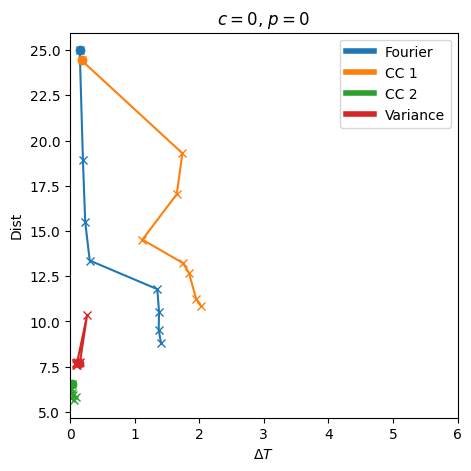

0 1


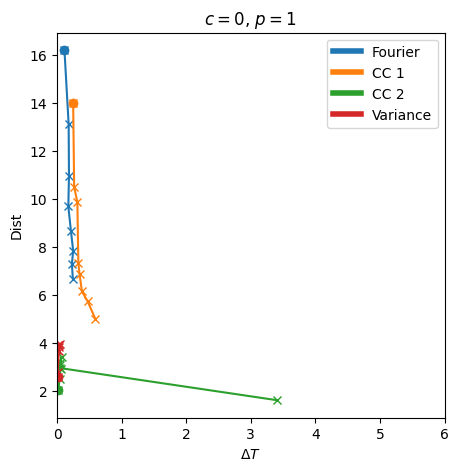

0 2


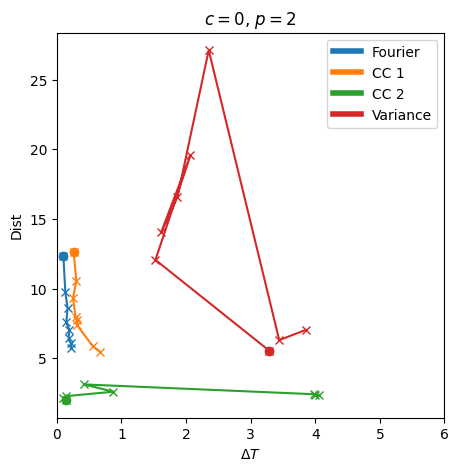

1 0


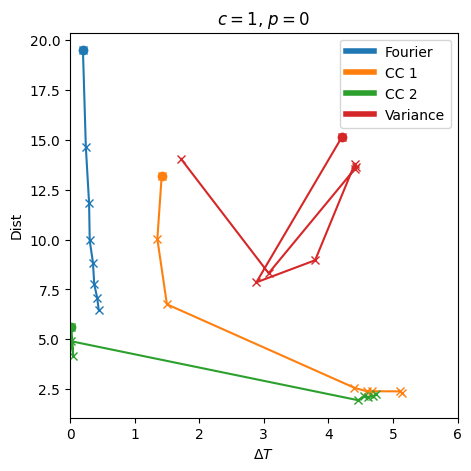

1 1


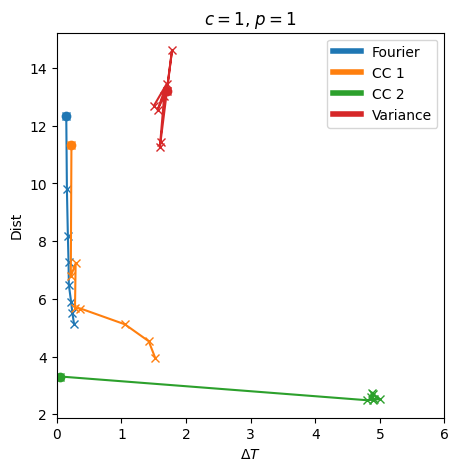

1 2


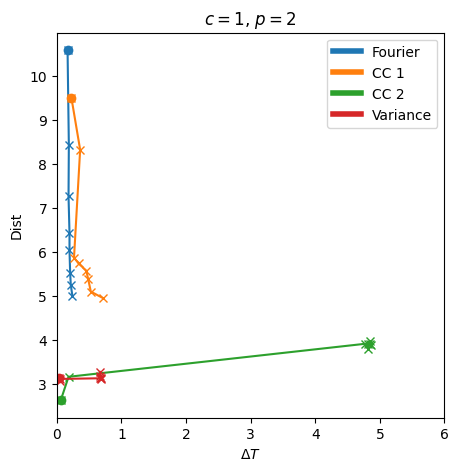

2 0


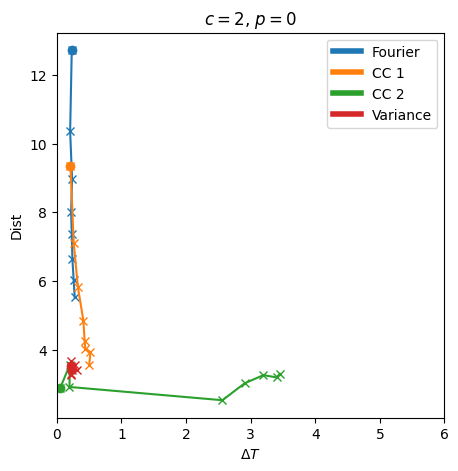

2 1


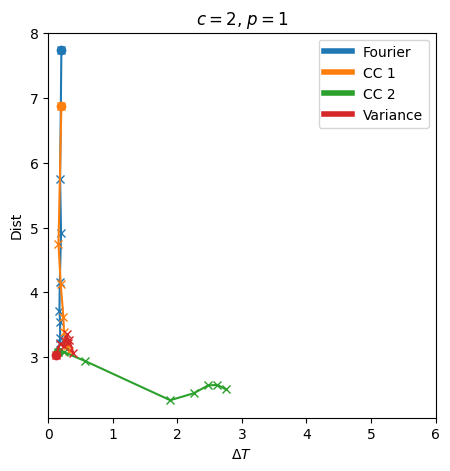

2 2


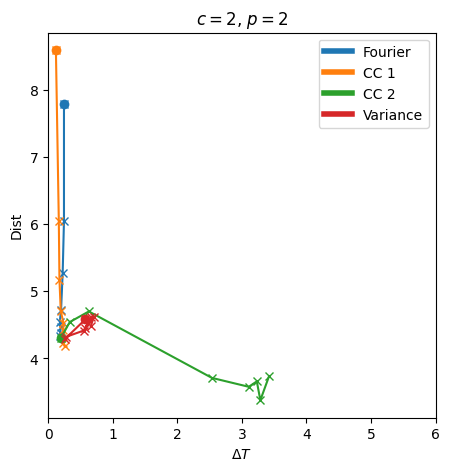

In [251]:
from matplotlib.lines import Line2D
custom_legend = [Line2D([0], [0], color=colors[0], lw=4),
                Line2D([0], [0], color=colors[1], lw=4),
                Line2D([0], [0], color=colors[2], lw=4),
                Line2D([0], [0], color=colors[3], lw=4)]

for c in range(len(cmats)):
    
    for pind in range(len(points)):
        print(c, pind)

        if [c, pind] in skip_array:
            continue

        fig, ax = plt.subplots(1, 1, figsize =(5, 5))

        for imet in range(4):

            delta_t = []
            dist = []

            for iw in range(w2_n):
                data = results["timings"][c][pind][imet][iw]
                ydata_ = []

                if data is None:
                    continue

                list_mean_dt = []

                for n1 in range(N):
                    list_dt = []
                    for n2 in range(N):
                        if n1 == n2:
                            continue
                        for p in data[n2]:
                            list_dt.append(np.amin(np.abs(p - data[n1])) * dt)

                    list_mean_dt.append(np.mean(list_dt))

                delta_t.append(np.mean(list_mean_dt))
                dist.append(results["distance"][c,pind,imet,iw])

                if iw == 0:
                    ax.plot(delta_t, dist, marker="o", color=colors[imet])

            ax.plot(delta_t, dist, marker="x", color=colors[imet])

        ax.set_ylabel(r"Dist")
        ax.set_xlabel(r"$\Delta T$")

        ax.set_xlim(0,6)

        ax.set_title(r"$c = $" + str(c) +  r", $p = $" + str(pind))

        ax.legend(custom_legend, ['Fourier', 'CC 1', 'CC 2', 'Variance'])

        plt.show()
        fig.savefig(os.path.join(dir, "corr_" + str(c) + "_" + str(pind) + ".png"), bbox_inches='tight')

0 0


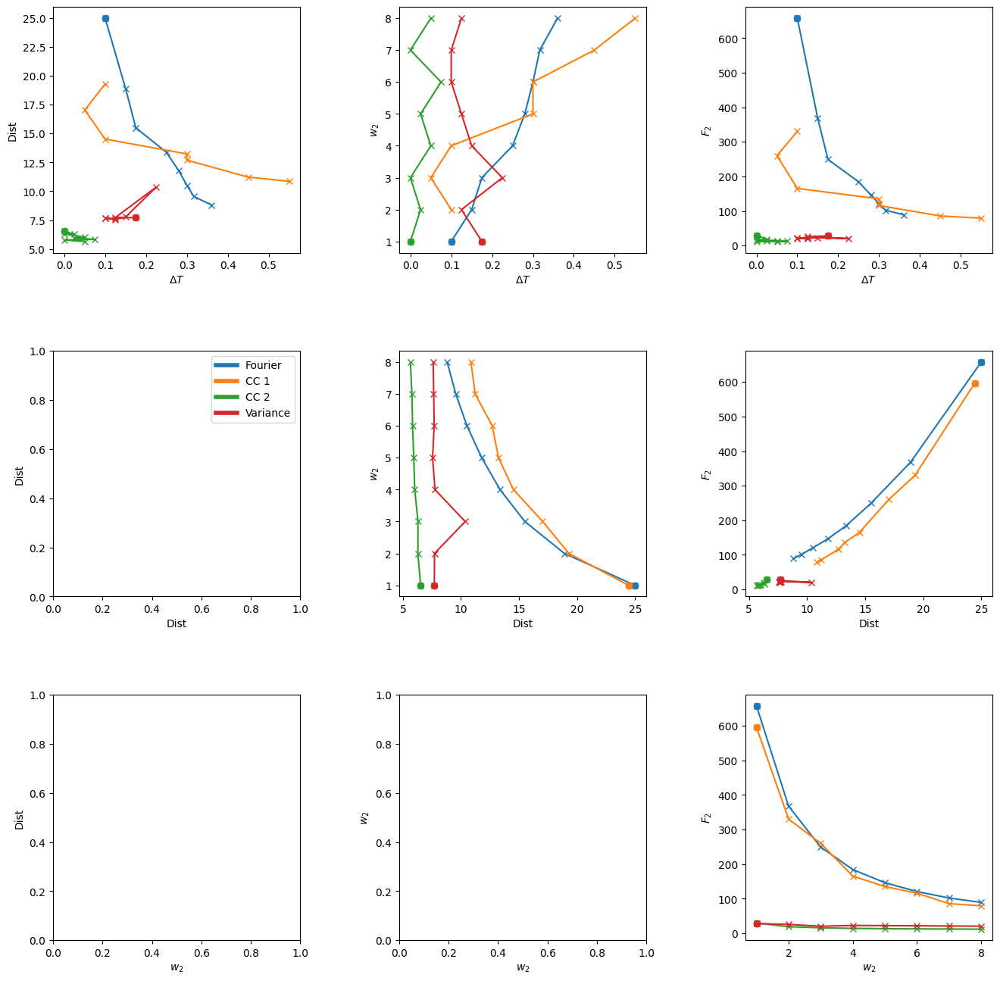

0 1


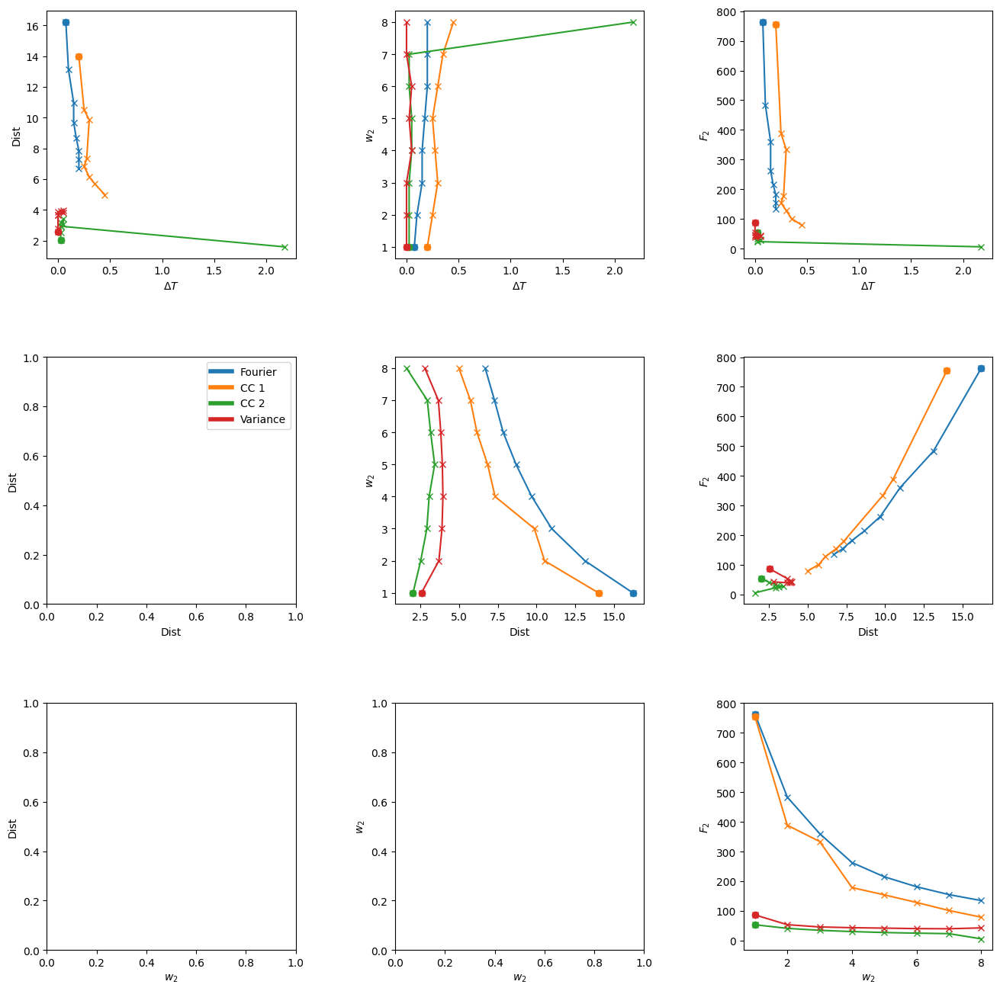

0 2


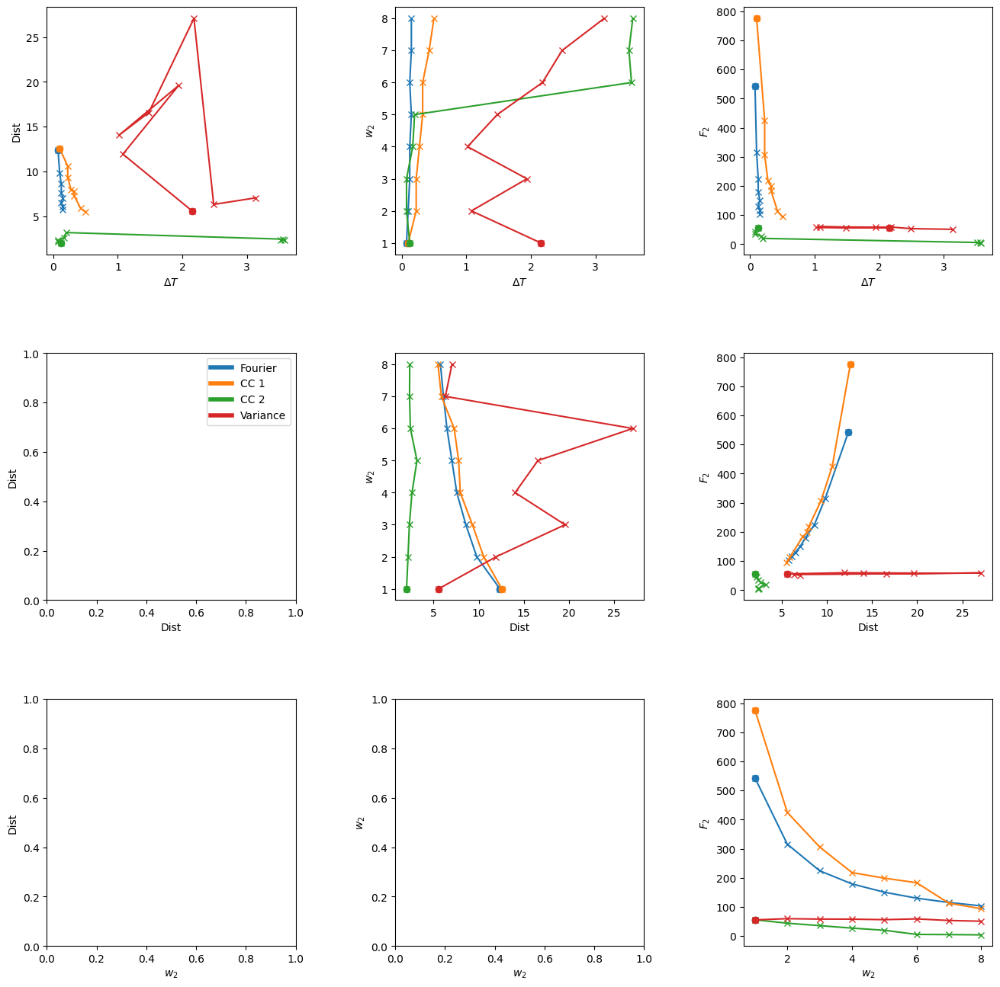

1 0


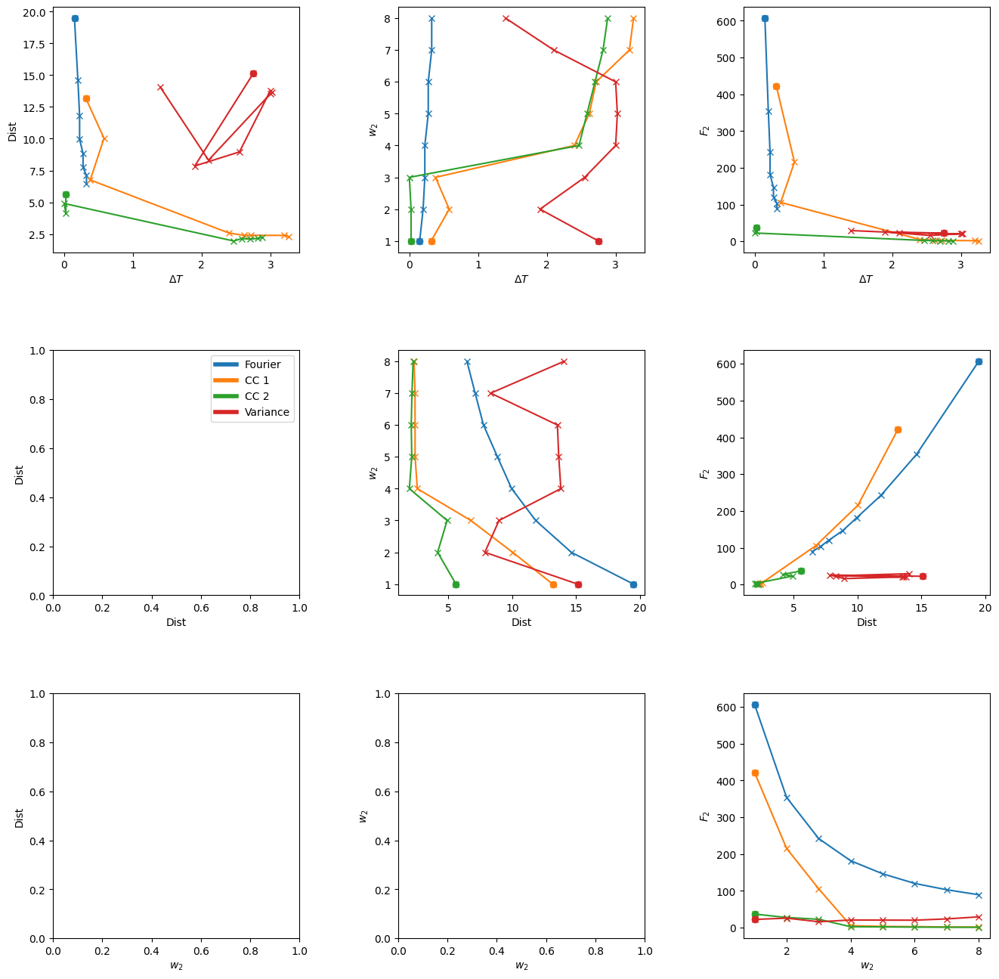

1 1


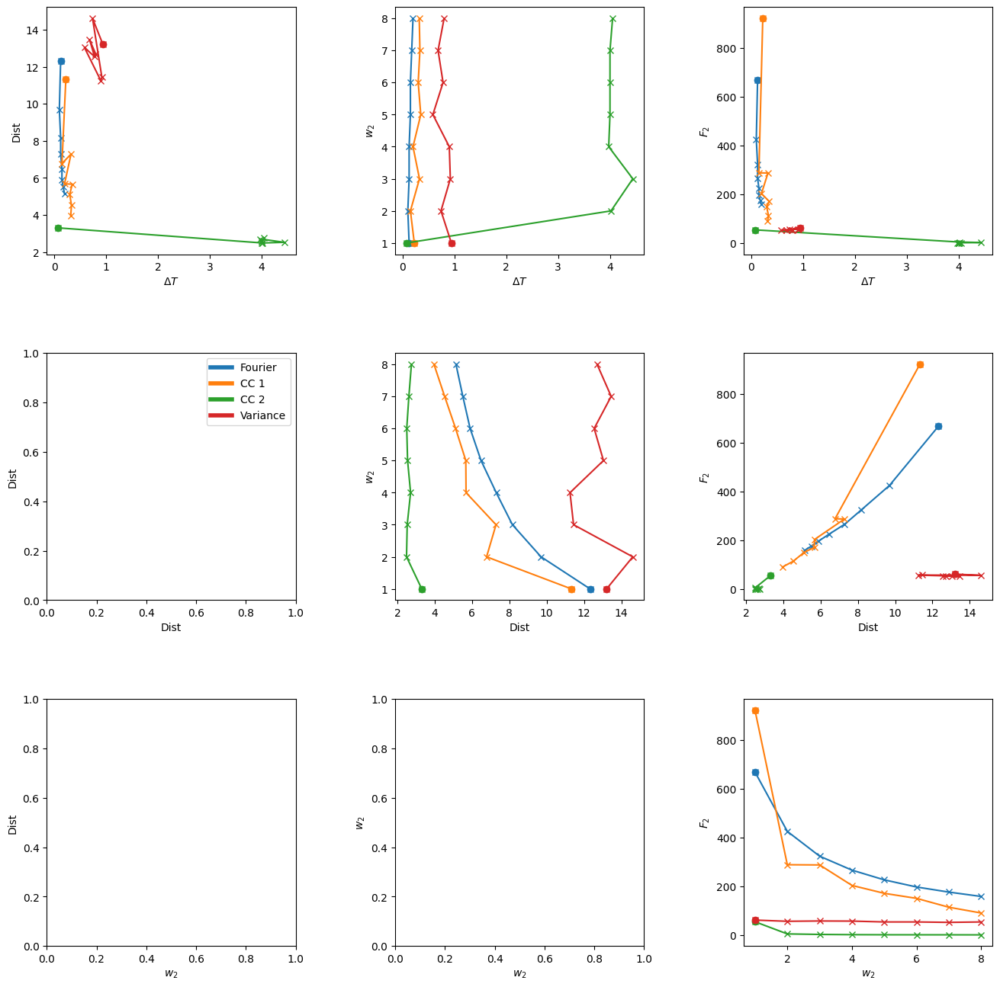

1 2


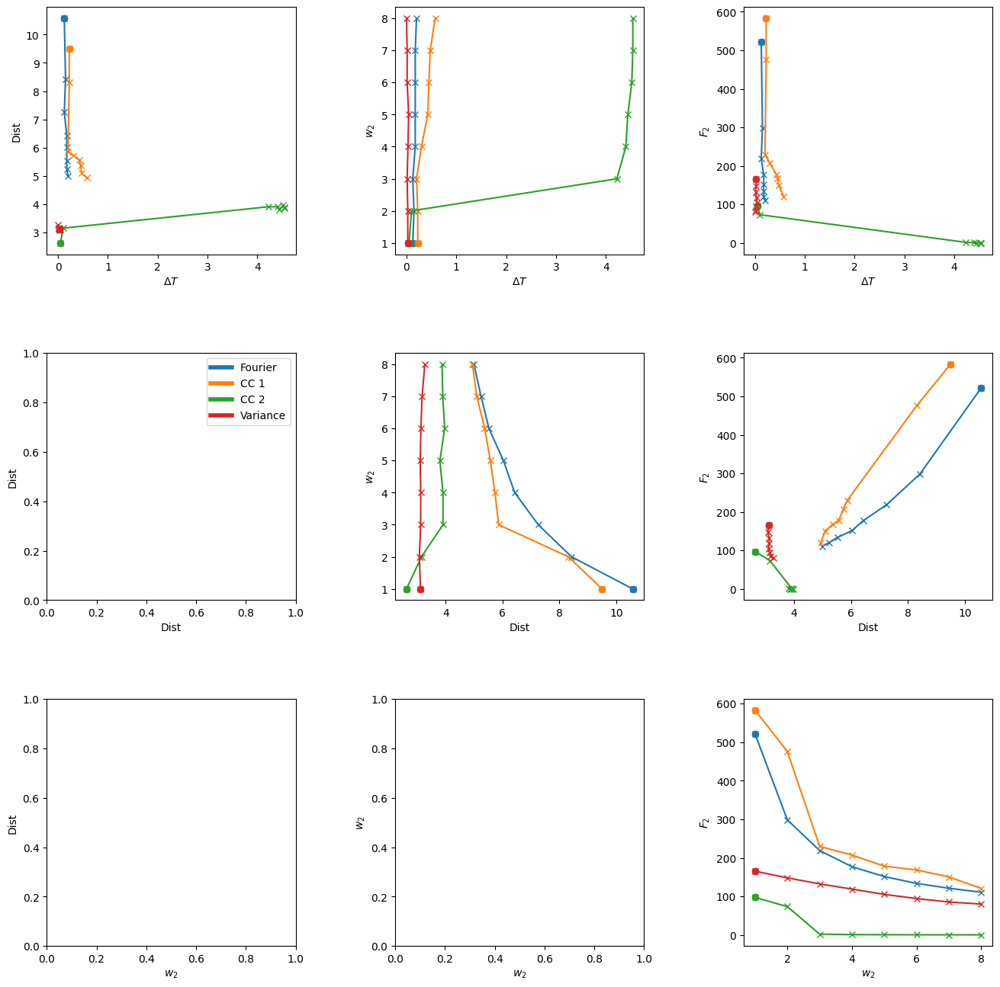

2 0


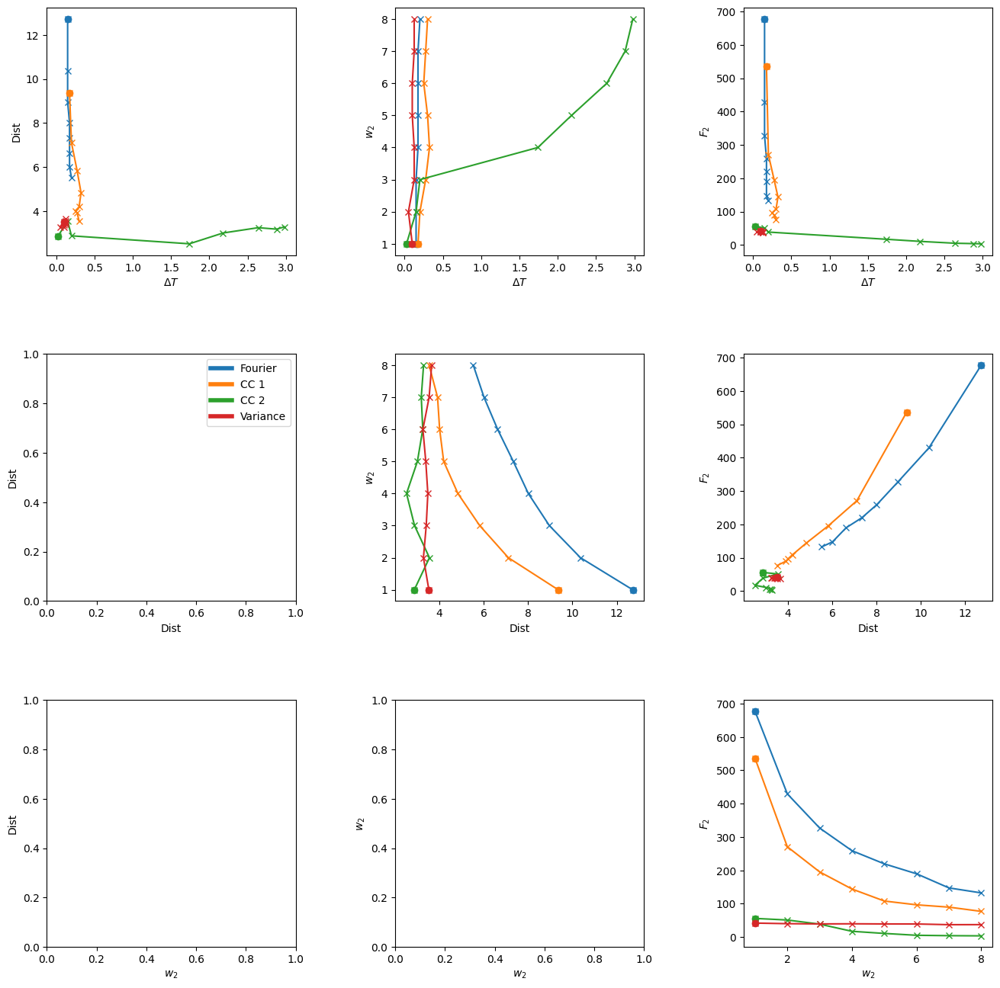

2 1


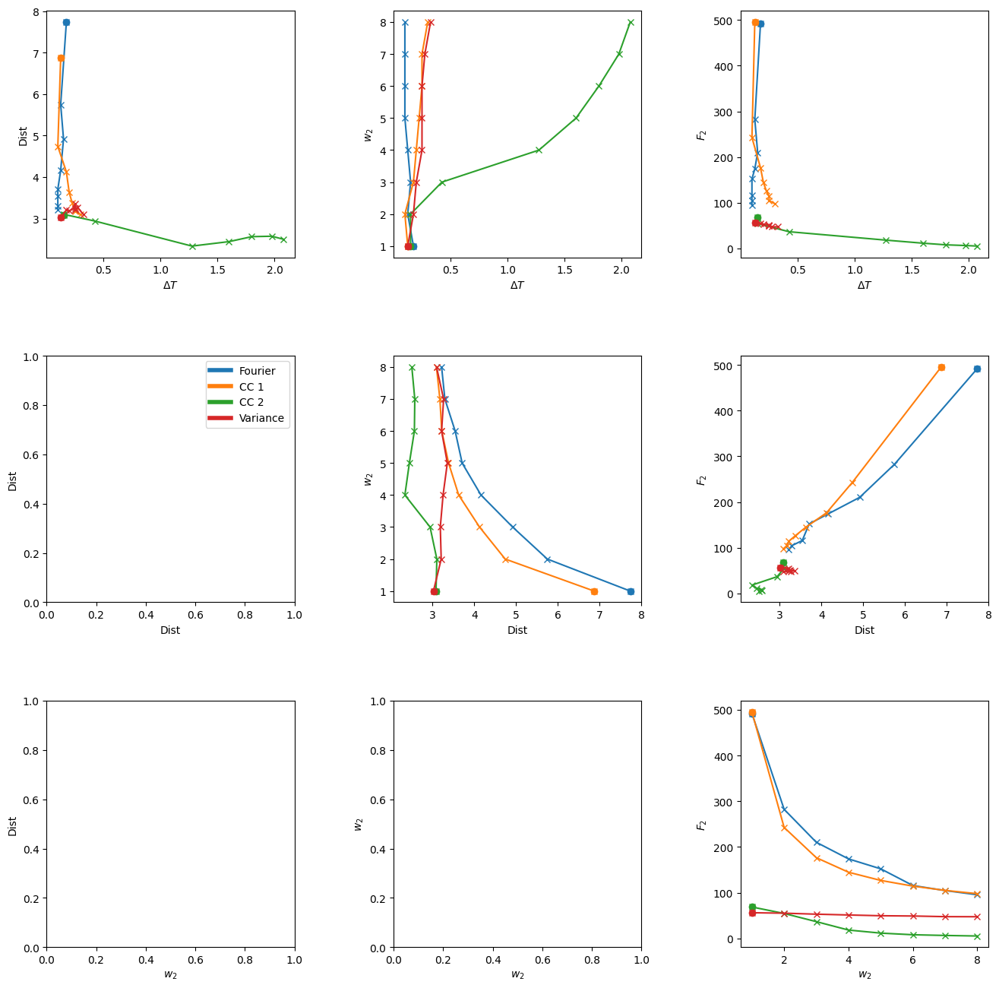

2 2


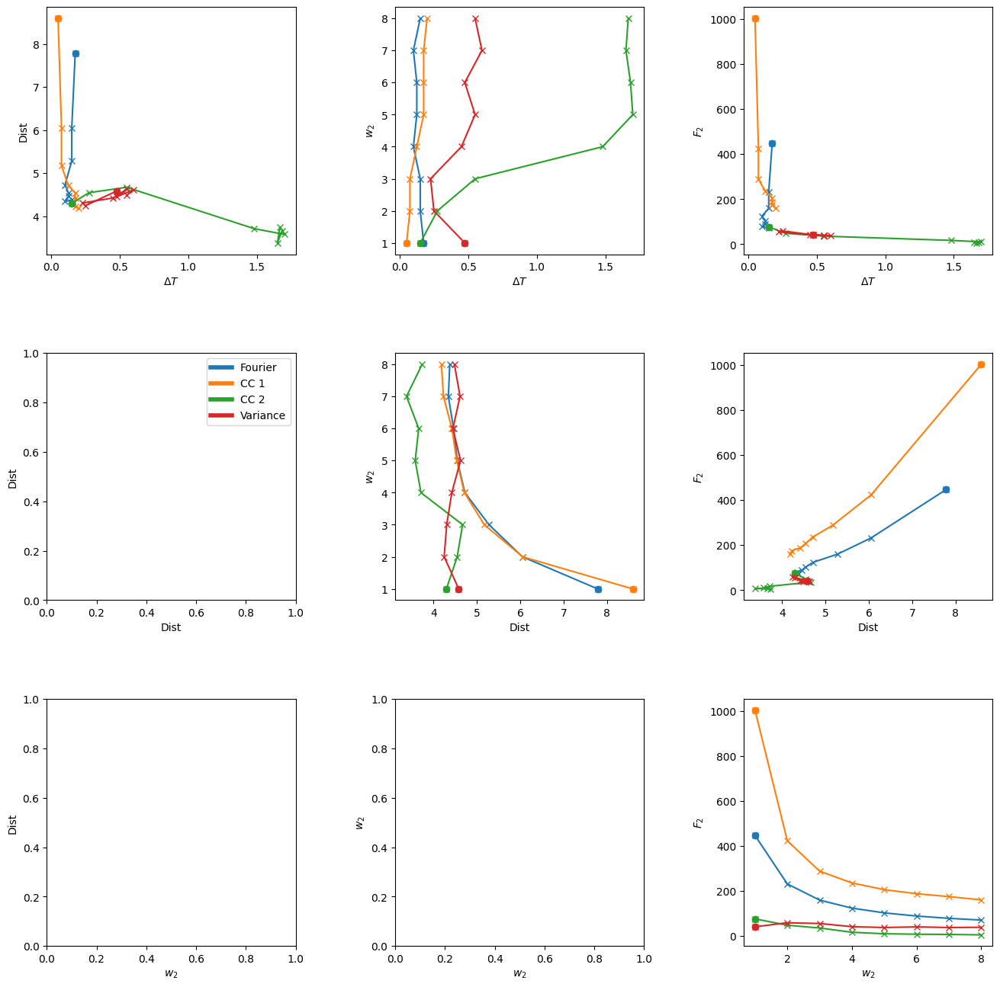

In [239]:
for c in range(len(cmats)):
    
    for pind in range(len(points)):
        print(c, pind)

        if [c, pind] in skip_array:
            continue

        fig, ax = plt.subplots(3, 3, figsize =(16, 16))
        plt.subplots_adjust(wspace=0.4, hspace=0.4)

        for imet in range(4):

            delta_t = []
            dist = []
            w2 = []
            f2 = []

            for iw in range(w2_n):
                data = results["timings"][c][pind][imet][iw]
                ydata_ = []

                if data is None:
                    continue

                list_mean_dt = []

                for n1 in range(N):
                    list_dt = []
                    for n2 in range(N):
                        if n1 == n2:
                            continue
                        for p in data[n2][1:-2]:
                            list_dt.append(np.amin(np.abs(p - data[n1])) * dt)

                    list_mean_dt.append(np.mean(list_dt))

                delta_t.append(np.amin(list_mean_dt))
                dist.append(results["distance"][c,pind,imet,iw])
                w2.append(results["w2"][c,pind,imet,iw]/results["w2"][c,pind,imet,0])
                f2.append(results["L2cost"][c,pind,imet,iw])

                if iw == 0:
                    ax[0,0].plot(delta_t, dist, marker="o", color=colors[imet])
                    ax[0,1].plot(delta_t, w2, marker="o", color=colors[imet])
                    ax[0,2].plot(delta_t, f2, marker="o", color=colors[imet])
                    ax[1,1].plot(dist, w2, marker="o", color=colors[imet])
                    ax[1,2].plot(dist, f2, marker="o", color=colors[imet])
                    ax[2,2].plot(w2, f2, marker="o", color=colors[imet])

            ax[0,0].plot(delta_t, dist, marker="x", color=colors[imet])
            ax[0,1].plot(delta_t, w2, marker="x", color=colors[imet])
            ax[0,2].plot(delta_t, f2, marker="x", color=colors[imet])

            ax[1,1].plot(dist, w2, marker="x", color=colors[imet])
            ax[1,2].plot(dist, f2, marker="x", color=colors[imet])

            ax[2,2].plot(w2, f2, marker="x", color=colors[imet])

        for k in range(3):
            ax[k,0].set_ylabel(r"Dist")
            #ax[k,0].set_ylim(0, 55)
            ax[k,1].set_ylabel(r"$w_2$")
            ax[k,2].set_ylabel(r"$F_2$")

            ax[0,k].set_xlabel(r"$\Delta T$")
            #ax[0,k].set_xlim(0,5.5)
            ax[1,k].set_xlabel(r"Dist")
            ax[2,k].set_xlabel(r"$w_2$")

            ax[0,k].vlines(mean_dt[c, pind], 0, 10, color="grey", linestyle=":")

        ax[1,0].legend(custom_legend, ['Fourier', 'CC 1', 'CC 2', 'Variance'])

        plt.show()
        fig.savefig(os.path.join(dir, "corr_" + str(c) + "_" + str(pind) + ".png"), bbox_inches='tight')